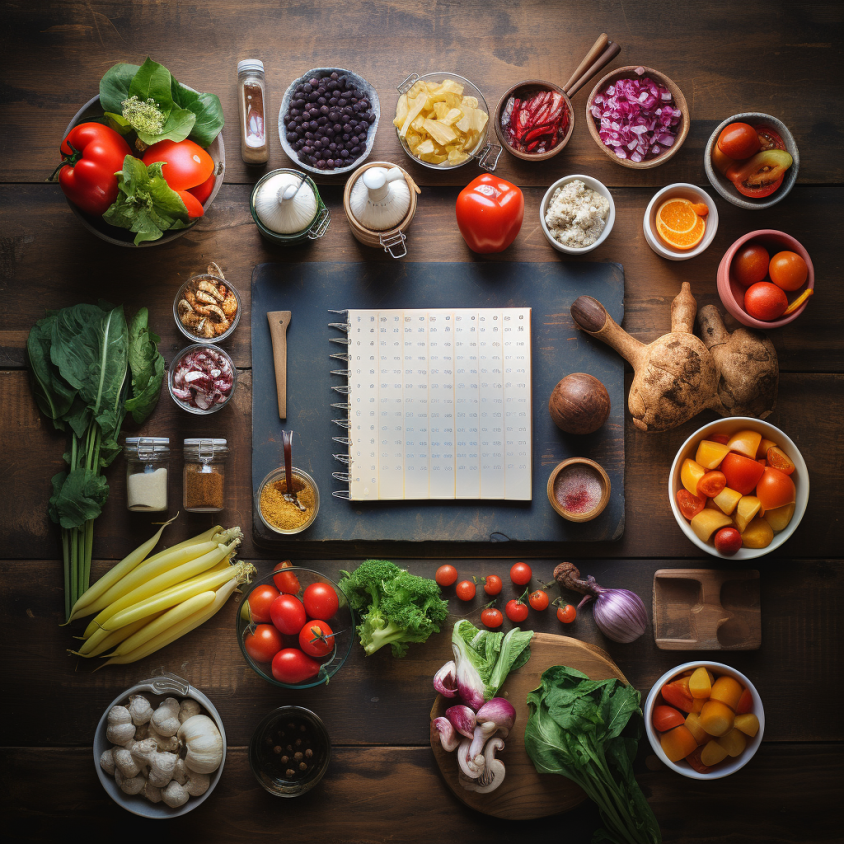

In [1]:
# Import healthy2.png image
from IPython.display import Image
Image(filename='recipe2.png')



<H1 size =10><center>Data Science Professional 2023 </center></H1>
<HR></HR>
<H2  color='#1A846B' size =7><center> Predictive Recipes Traffic Webste</center></H2>

# <a id='toc1_'></a>[Report Summary](#toc0_)

Your written report should include both code, output and written text summaries of the following:

Data Validation:
Describe validation and cleaning steps for every column in the data
Exploratory Analysis:
Include two different graphics showing single variables only to demonstrate the characteristics of data
Include at least one graphic showing two or more variables to represent the relationship between features
Describe your findings
Model Development
Include your reasons for selecting the models you use as well as a statement of the problem type
Code to fit the baseline and comparison models
Model Evaluation
Describe the performance of the two models based on an appropriate metric
Business Metrics
Define a way to compare your model performance to the business
Describe how your models perform using this approach
Final summary including recommendations that the business should undertak

## <a id='toc1_1_'></a>[Data Validation](#toc0_) 📊

#### 1. **Recipe Identification** 📖
- Unique Identifiers: `947` 
- Status: No missing values, no cleaning required.

#### 2. **Categories** 📁
- Unique Values: `11` (Previously `10`)
- Modification: 'Chicken Breast' revised to 'Chicken', one hot encoded subsequently.

#### 3. **Servings** 🍲
- Unique Values: `6` 
- Modification: Transformed character to integer, refined descriptions.

#### 4. **Traffic Analysis** 🚦
- Missing Values: `373` (Not at random)
- Modification: Replaced `NA` and `NaN` with 'Low', encoded as `1` (High) and `0` (Not High).

#### 5. **Nutritional Information** 🍎
- Missing Values: `52` in Calories, Carbohydrate, Sugar, Protein.
- All numerical features exhibit positive skewness, indicating right-skewed distributions. This aligns with our observations from the histograms.
- All features have kurtosis values significantly greater than 0, indicating that their distributions have heavier tails compared to a normal distribution. This suggests the presence of potential outliers.
- Strategy: Grouped by category & servings, utilized mean values, and applied Power Transformer for normal distribution.
  - **Calories**: 
    - Non-null Values: `895`
    - Modification: Capped extreme outliers, scaled using MinMax.
  - **Carbohydrate**: 
    - Non-null Values: `895`
    - Modification: Capped extreme outliers, scaled using MinMax.
  - **Sugar**: 
    - Non-null Values: `895`
    - Modification: Capped extreme outliers, scaled using MinMax.
  - **Protein**: 
    - Non-null Values: `895`
    - Modification: Capped extreme outliers, scaled using MinMax.

## Data Analysis 📈

#### 1. **Correlation Assessment** 🔗
- Employed visualization and statistical methods to analyze inter-column correlations.

#### 2. **Feature Engineering** 🛠️
- Developed new features, 'Healthy' and 'Difficulty Preparing', based on derived insights.


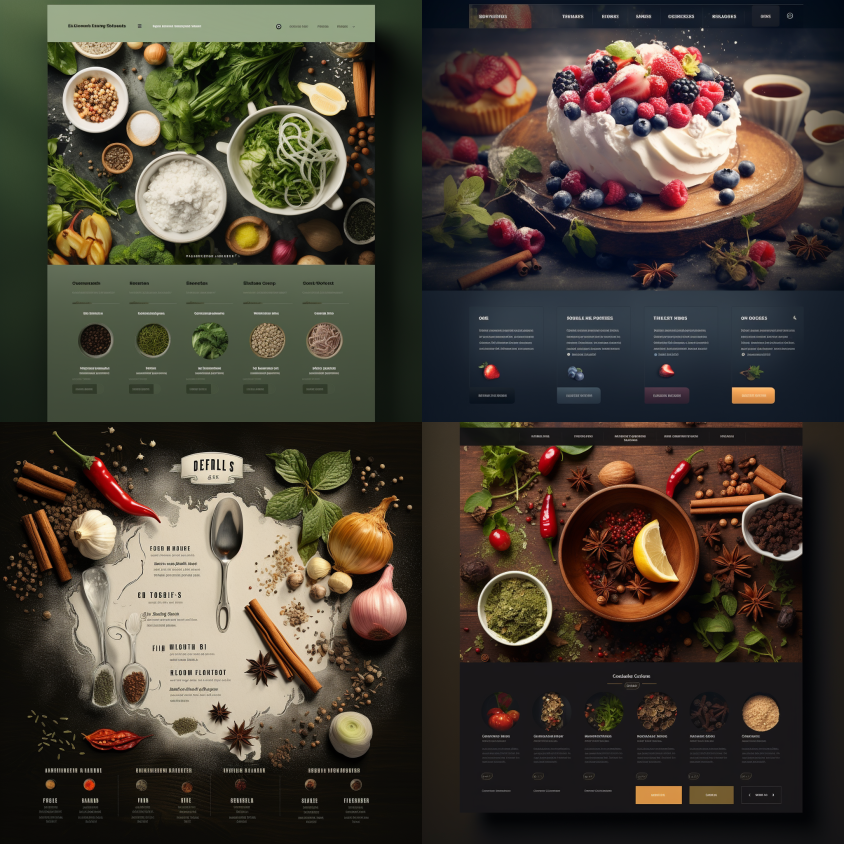

In [2]:
# Import healthy2.png image
from IPython.display import Image
Image(filename='website3.png')

# Notebook

# <a id='toc2_'></a>[Import Libaries](#toc0_)

In [3]:
# Import libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats

from scipy.stats import ttest_ind

<frozen importlib._bootstrap>:228: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject


# <a id='toc3_'></a>[Data Validation and Cleansing](#toc0_)

## Data Checks

In [4]:
df = pd.read_csv("recipe_site_traffic_2212.csv")
df

,recipe,calories,carbohydrate,sugar,protein,category,servings,high_traffic
0,1,NaN,NaN,NaN,NaN,Pork,6,High
1,2,35.48,38.56,0.66,0.92,Potato,4,High
2,3,914.28,42.68,3.09,2.88,Breakfast,1,NaN
3,4,97.03,30.56,38.63,0.02,Beverages,4,High
4,5,27.05,1.85,0.80,0.53,Beverages,4,NaN
...,...,...,...,...,...,...,...,...
942,943,1161.00,5.31,22.39,44.22,Lunch/Snacks,2,NaN
943,944,NaN,NaN,NaN,NaN,Potato,2,High
944,945,951.74,29.42,3.57,13.87,Pork,2,High
945,946,266.61,35.77,0.97,8.07,Potato,6,High


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 947 entries, 0 to 946
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   recipe        947 non-null    int64  
 1   calories      895 non-null    float64
 2   carbohydrate  895 non-null    float64
 3   sugar         895 non-null    float64
 4   protein       895 non-null    float64
 5   category      947 non-null    object 
 6   servings      947 non-null    object 
 7   high_traffic  574 non-null    object 
dtypes: float64(4), int64(1), object(3)
memory usage: 59.3+ KB


In [6]:
# Set index as recipe
df = df.set_index('recipe')

In [7]:
# get statistical summary
df.describe()

,calories,carbohydrate,sugar,protein
count,895.000000,895.000000,895.000000,895.000000
mean,435.939196,35.069676,9.046547,24.149296
std,453.020997,43.949032,14.679176,36.369739
min,0.140000,0.030000,0.010000,0.000000
25%,110.430000,8.375000,1.690000,3.195000
50%,288.550000,21.480000,4.550000,10.800000
75%,597.650000,44.965000,9.800000,30.200000
max,3633.160000,530.420000,148.750000,363.360000


In [8]:
# Check for missing values and data types
missing_values = df.isnull().sum()
data_types = df.dtypes

missing_values, data_types

(calories         52
 carbohydrate     52
 sugar            52
 protein          52
 category          0
 servings          0
 high_traffic    373
 dtype: int64,
 calories        float64
 carbohydrate    float64
 sugar           float64
 protein         float64
 category         object
 servings         object
 high_traffic     object
 dtype: object)

| Missing Values | Columns                                                |
|-------------|---------------------------------------------------------|
| 52   | </br> calories, carbohydrate, sugar, and protein columns. |
| 373        |  </br>high_traffic  |

<div class="alert alert-success" role="alert">
  <h4 class="alert-heading">Data Types Analysis:</h4>
  
  <ul>
    <li><strong>Nutritional Information:</strong>
      <ul>
        <li><code>calories</code>, <code>carbohydrate</code>, <code>sugar</code>, and <code>protein</code> columns are of type <code>float</code>, which is suitable for representing nutritional values.</li>
      </ul>
    </li>
    <li><strong>Categorical Data:</strong>
      <ul>
        <li>The <code>category</code> and <code>high_traffic</code> columns are of type <code>object</code> (likely strings), aligning with the categorical nature of these columns.</li>
      </ul>
    </li>
    <li><strong>Serving Information:</strong>
      <ul>
        <li>The <code>servings</code> column is of type <code>object</code>, which could pose a <em>concern</em> as a numerical data type might be more appropriate for representing serving sizes.</li>
      </ul>
    </li>
  </ul>
  
</div>


In [9]:
# Check the number of rows in the dataset
total_rows = len(df)

# Calculate the proportion of missing values for affected columns
missing_proportions = missing_values / total_rows

total_rows, missing_proportions[['calories', 'carbohydrate', 'sugar', 'protein', 'high_traffic']]


(947,
 calories        0.054910
 carbohydrate    0.054910
 sugar           0.054910
 protein         0.054910
 high_traffic    0.393875
 dtype: float64)

<div class="alert alert-success" role="alert">
  <h4 class="alert-heading">Dataset Size and Missing Values Analysis:</h4>
  
  <p>
    Understanding the size of the dataset and the proportion of missing values is crucial for data analysis. 
  </p>
  
  <ul>
    <li><strong>High Traffic Data:</strong>
      <ul>
        <li>A significant portion, 40%, of the <code>high_traffic</code> column data is missing.</li>
        <li>It's proposed to replace the <code>NaN</code> values with 'Low' to indicate non-high traffic scenarios.</li>
      </ul>
    </li>
    <li><strong>Missing Values Imputation:</strong>
      <ul>
        <li>Approximately 5.49% of data is missing in some columns, considering the option of imputation using statistical measures like median or mean.</li>
        <li>However, imputation trials showed a decline in model performance, leading to the decision of discarding this option and dropping the affected entries instead.</li>
      </ul>
    </li>
  </ul>
  
</div>


##  Data Distribution

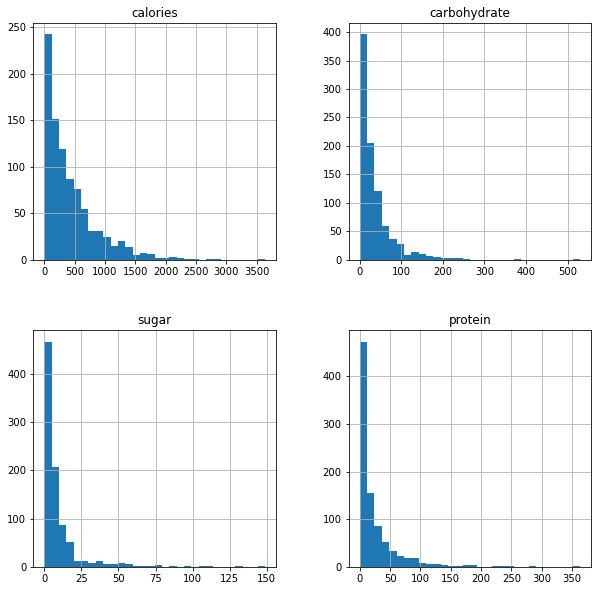

In [10]:
#plot all columns to see the distribution
df.hist(figsize=(10,10), bins=30)
plt.show()

In [11]:
# Calculate skewness and kurtosis for each feature in the dataset
skewness = df.skew()
kurtosis = df.kurtosis()

# Combine the skewness and kurtosis data for easy visualization
skew_kurt_df = pd.DataFrame({'Skewness': skewness, 'Kurtosis': kurtosis})

skew_kurt_df

/var/folders/ks/5bc1x9p158vgc4774v7r2tq40000gn/T/ipykernel_10539/1113275944.py:2: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  skewness = df.skew()
/var/folders/ks/5bc1x9p158vgc4774v7r2tq40000gn/T/ipykernel_10539/1113275944.py:3: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  kurtosis = df.kurtosis()


,Skewness,Kurtosis
calories,2.036151,6.085271
carbohydrate,3.756980,25.609276
sugar,4.223352,24.370963
protein,3.509453,18.197453


Description of Findings:

> **Histogram for _Calories_**:<br>
> - The majority of recipes possess caloric values within a range of approximately 0 to 1000 calories.
> - A right-skewed distribution is observed, indicating a few recipes with significantly higher caloric content extending the distribution towards the right.
> - A prominent peak around the 100-150 calorie range suggests a substantial number of recipes fall within this caloric bracket.

> **Histogram for _Carbohydrates_**:<br>
> - Most recipes have carbohydrate content ranging from 0 to 50, with a few exceptions extending beyond this range.
> - Similar to calories, a right-skewed distribution is noted, representing a small number of recipes with substantially higher carbohydrate content.

> **Histogram for _Sugar_**:<br>
> - Predominantly, recipes exhibit sugar content below 20, with few exceptions.
> - The distribution again is right-skewed, highlighting a small number of recipes with significantly higher sugar content.

> **Histogram for _Protein_**:<br>
> - Protein content largely falls below 50, with a dense clustering observed in the 0 to 10 range.
> - A right-skewed distribution indicates a few recipes with much higher protein content.

> **Skewness**:
> - Positive skewness is observed across all numerical features, aligning with the right-skewed distributions noticed in the histograms.

> **Kurtosis**:
> - All features exhibit kurtosis values significantly above 0, implying heavier tails in their distributions compared to a normal distribution, which hints at the potential presence of outliers.


## Data Preparation 

Let's eximine the data and unique values 

In [12]:
# Check unique values in 'category', 'servings', and 'high_traffic' columns
category_unique_values = df['category'].unique()
servings_unique_values = df['servings'].unique()
high_traffic_unique_values = df['high_traffic'].unique()

category_unique_values, servings_unique_values, high_traffic_unique_values


(array(['Pork', 'Potato', 'Breakfast', 'Beverages', 'One Dish Meal',
        'Chicken Breast', 'Lunch/Snacks', 'Chicken', 'Vegetable', 'Meat',
        'Dessert'], dtype=object),
 array(['6', '4', '1', '2', '4 as a snack', '6 as a snack'], dtype=object),
 array(['High', nan], dtype=object))

**Category Analysis** 📁
- Consistency Check:
    - The values appear to be consistent with no evident spelling errors.
    - Suggestion: Consider merging similar categories like 'Chicken Breast' and 'Chicken' for better categorization.

**Servings Analysis** 🍲
- Current State:
    - Entries like '4 as a snack' and '6 as a snack' include additional text, which likely results in the column being of type 'object'.
- Recommendations:
    - Clean these entries to extract the numerical part, converting the entire column to a numerical type for better analysis and processing.

**High Traffic Analysis** 🚦
- Current State:
    - The values are either 'High' or NaN (missing), indicating a binary categorization.
- Recommendations:
    - To better represent traffic data, consider replacing NaN values with 'Low' or another suitable value indicating non-high traffic conditions.




In [13]:
# Chicken and Chicken Breast can be put together, replace Chicken Breast with Chicken
df['category'].replace('Chicken Breast', 'Chicken', inplace=True)

In [14]:
# Extract numerical values from the 'servings' column and convert to integer
df['servings'] = df['servings'].str.extract('(\d+)').astype(int)

# Check the unique values in 'servings' after cleaning
servings_unique_values_cleaned = df['servings'].unique()
servings_unique_values_cleaned


array([6, 4, 1, 2])

In [15]:
#replace NaN in high Traffic with Low
df['high_traffic'].fillna('Low', inplace=True)

The code categorizes items in the DataFrame as healthy or not based on their category and nutritional values, and then adds a new column to the DataFrame to store this binary classification.

## New Features 

### Healthiness Feature 🍏

To determine the healthiness of food items in our dataset, we've employed specific criteria grounded in international health guidelines and considerations. Here's the rationale for each criterion:

1. **Vegetable Category 🥦**: The World Health Organization (WHO) underscores the significance of fruits and vegetables for maintaining a balanced diet. It advises the consumption of a minimum of 400g (equivalent to five portions) of fruits and vegetables daily for adults, excluding starchy roots such as potatoes and sweet potatoes​¹​. Given the nutritional benefits of vegetables, any food item labeled 'Vegetable' is immediately classified as healthy.

2. **Calorie Threshold (<= 400) 🔥**: The WHO highlights the importance of ensuring a balance between energy intake and energy expenditure to prevent unwanted weight gain. While the WHO doesn't prescribe a specific caloric limit, the 400-calorie threshold in the code may be based on other guidelines or health considerations​​.

3. **Carbohydrate Content (>= 15 and <= 80) 🍞**: Although the WHO has revised its stance on carbohydrate consumption, emphasizing total fat, saturated, and trans-fat intakes​²​, it hasn't provided a precise range for healthy carbohydrate intake. Meanwhile, the United States Department of Agriculture (USDA) recommends that adults derive 45% to 65% of their daily calories from carbohydrates. This guideline may have influenced the carbohydrate thresholds set in the code​​.

4. **Sugar Content (<= 10) 🍭**: The WHO suggests limiting free sugar intake to less than 10% of total daily energy. This is roughly equivalent to 50g (or around 12 level teaspoons) of sugar for someone ingesting about 2000 calories daily. Even further, decreasing this limit to under 5% of total daily intake is proposed for augmented health benefits​​.

5. **Protein Content (>= 30) 🥩**: The USDA advises adults to get between 10% and 35% of their daily calories from protein​. For an individual on a 2000-calorie diet, this would equate to between 50 and 175 grams of protein daily. The code's 30-gram protein threshold might be set to reflect the minimum protein intake for a particular food item to be deemed healthy.

In [16]:
def determine_healthiness(row):
    if row['category'] == 'Vegetable':
        return 1
    elif (row['calories'] <= 400 and 
          row['carbohydrate'] >= 15 and 
          row['carbohydrate'] <= 80 and 
          row['sugar'] <= 10 and 
          row['protein'] >= 30):
        return 1
    else:
        return 0

# Apply the function to each row of the dataframe
df['healthy'] = df.apply(determine_healthiness, axis=1)

In [17]:
df['category'].unique()


array(['Pork', 'Potato', 'Breakfast', 'Beverages', 'One Dish Meal',
       'Chicken', 'Lunch/Snacks', 'Vegetable', 'Meat', 'Dessert'],
      dtype=object)

In [18]:
# percentage healthy of total rows
df[df['healthy']==1].value_counts(['high_traffic'])/len(df)

high_traffic
High            0.109820
Low             0.020063
dtype: float64

In [19]:
# count healthy 
df[df['healthy']==1].value_counts(['high_traffic'])

high_traffic
High            104
Low              19
dtype: int64

### Difficulty Feature 🍴🔍

The `difficulty` variable aims to quantify the complexity of preparing a particular recipe, based on two primary factors: the recipe's category and the number of servings. Here's a deeper dive into the reasoning:

1. **Category-based Difficulty Points 🍛**:
    - Every recipe category inherently comes with its own set of challenges. For example, making a dessert might generally be more intricate than whipping up a beverage. 
    - The `category_points` dictionary assigns a base difficulty score to each category. These scores range from 1 to 4, where 1 indicates a relatively simple preparation process (e.g., 'Beverages' and 'Breakfast') and 4 signifies more complex recipes (e.g., 'Dessert', 'Meat', and 'Pork').
    
2. **Servings as a Proxy for Complexity 🥘**:
    - Intuitively, the number of servings can influence the preparation complexity. Cooking for more people might involve more ingredients, larger equipment, or more meticulous planning. 
    - In the current setup, the `difficulty` score increases linearly with the number of servings. This means a recipe intended for 5 people will have a difficulty score 5 points higher than the same recipe meant for a single person.
    
3. **Resulting Difficulty Score 📊**:
    - The final `difficulty` score for each recipe is the sum of its category-based score and its servings. 
    - This approach provides a holistic view of the recipe's complexity, combining both the inherent challenges of its category and the logistics of preparing it for multiple people.
    
4. **Analysis 📈**:
    - After calculating the `difficulty` score for each recipe, the code groups the data by difficulty and counts the number of recipes in each difficulty level that are associated with high traffic. This could provide insights into which difficulty levels are most popular or draw the most attention.

In summary, the `difficulty` variable offers a synthesized metric representing the intricacy of a recipe, considering both its category and intended audience size. As with any scoring system, while it encapsulates certain key factors, it may require refinements based on feedback, user behavior, or additional considerations.

---

In [20]:
#Difficulty 

category_points = {'Beverages': 1, 'Breakfast': 1, 'Chicken': 3, 'Dessert': 4,
                   'Lunch/Snacks': 3, 'Meat': 4, 'One Dish Meal': 3, 'Pork': 4, 'Potato': 1, 'Vegetable': 1}

# Create a dictionary to map servings to difficulty points

# Create a new column "difficulty" by mapping the category and servings to their corresponding points
df['difficulty'] = df['category'].map(category_points) + df['servings']
df[['difficulty','high_traffic']].groupby('difficulty').value_counts()

difficulty  high_traffic
2           Low              39
            High             29
3           High             39
            Low              30
4           High             43
            Low              23
5           High            153
            Low             112
6           High             33
            Low              13
7           High            111
            Low              97
8           High             83
            Low              20
9           High             41
            Low              25
10          High             42
            Low              14
dtype: int64

In [21]:
high_traffic_df = df[df['high_traffic'] == 'High']
low_traffic_df = df[df['high_traffic'] == 'Low']


t, p = ttest_ind(high_traffic_df['difficulty'], low_traffic_df['difficulty'])
print("t-statistic for difficulty: ", t)
print("p-value for difficulty: ", p,'\n')

t-statistic for difficulty:  3.7566960679931305
p-value for difficulty:  0.00018271137797831383 



In [22]:
def rank_difficulty(value):
    if 2 <= value <= 4:
        return 1  # Easy
    elif 5 <= value <= 7:
        return 2  # Medium
    elif 8 <= value <= 10:
        return 3  # Hard
    else:
        return None  # For values outside the range or missing data

df['difficulty'] = df['difficulty'].apply(rank_difficulty)


In [23]:
df[['difficulty','high_traffic']].groupby('difficulty').value_counts()


difficulty  high_traffic
1           High            111
            Low              92
2           High            297
            Low             222
3           High            166
            Low              59
dtype: int64

In [24]:
high_traffic_df = df[df['high_traffic'] == 'High']
low_traffic_df = df[df['high_traffic'] == 'Low']


t, p = ttest_ind(high_traffic_df['difficulty'], low_traffic_df['difficulty'])
print("t-statistic for difficulty: ", t)
print("p-value for difficulty: ", p,'\n')

t-statistic for difficulty:  4.157459439797291
p-value for difficulty:  3.510462471586904e-05 



It's very obvious that the p-value is less than 0.05, which is commonly used as a threshold for determining statistical significance. This indicates that there is a statistically significant difference in means of these features between high traffic and low traffic recipes. so difficulty of the recipe may affect the traffic in some way

Now I will divide the difficulty into 3 groups:

from 2 to 4 is easy
from 4 to 7 is medium
from 7 to 10 is hard

# Handling Null values of calories, carbohydrate, sugar, and protein

## Handling Missing Values in Nutritional Columns 🔄

The nutritional columns `'calories'`, `'carbohydrate'`, `'protein'`, and `'sugar'` exhibit significant skewness, as observed from the histograms and skewness statistics. This skewness is largely attributed to the inherent differences in nutritional content across different food categories. For instance, meat-based recipes tend to have higher protein content compared to vegetable-based recipes. 

Given the skewness of the data, utilizing the mean for imputing missing values may lead to biased estimates as the mean is sensitive to outliers and extreme values. On the other hand, the median, being a more robust measure of central tendency, remains unaffected by outliers and provides a more accurate reflection of the dataset's central tendency. Therefore, median imputation is chosen as a more reliable method to handle missing values in this scenario.

Moreover, the median imputation is performed group-wise based on the `'category'` and `'servings'` columns to account for the heterogeneity in nutritional content across different categories and serving sizes. This approach ensures that the imputed values are contextually relevant and in alignment with the inherent structure of the dataset.

Below is the Python code snippet to view the summary statistics and perform the median imputation for missing values in the nutritional columns:


In [26]:
summary=df.pivot_table(index=["category","servings"],values=['calories','carbohydrate','protein','sugar'], aggfunc=[np.mean,np.median, max, min])
summary.head(10)

mean                                      median  \
                      calories carbohydrate    protein      sugar calories   
category  servings                                                           
Beverages 1         180.341000    13.237000   0.751500  10.337500  154.465   
          2         245.478824    21.030000   0.572353  15.809412  199.340   
          4         162.894706    14.629118   0.551765  16.265294  129.450   
          6         144.427619    16.586190   0.533333   5.947619   88.170   
Breakfast 1         401.969615    39.189615  24.025769   4.534231  253.465   
          2         374.082857    41.820000  12.289048   7.759048  313.530   
          4         266.214634    40.415122  18.059756   7.748780  166.850   
          6         330.973889    36.403889   9.681667  11.222778  272.125   
Chicken   1         529.023429    20.544571  48.430000   4.998000  393.730   
          2         503.795517    39.294138  59.871379   5.911034  384.960   

                                                    max                       \
                   carbohydrate protein  sugar calories carbohydrate protein   
category  servings                                                             
Beverages 1              11.120   0.400  9.385   463.52        56.72    2.55   
          2              13.870   0.560  7.580   836.95        77.70    1.48   
          4              12.415   0.405  9.885   581.97        45.21    1.73   
          6               8.840   0.400  6.470   502.89        58.08    1.58   
Breakfast 1              28.850  13.975  3.590  1724.25       158.92   92.01   
          2              24.360   8.540  5.430  1335.54       173.93   35.28   
          4              32.870  15.570  4.540   988.66       159.72   53.33   
          6              20.905   8.225  8.860   958.28       140.96   45.89   
Chicken   1              12.900  44.740  2.600  1878.82        88.55  136.89   
          2              23.300  48.650  3.990  2051.34       243.20  286.97   

                               min                             
                    sugar calories carbohydrate protein sugar  
category  servings                                             
Beverages 1         19.78    11.57         0.58    0.00  0.50  
          2         59.04    21.09         0.16    0.01  0.68  
          4         56.78     0.30         0.35    0.01  0.16  
          6         11.78     0.54         1.18    0.02  0.01  
Breakfast 1         14.45     0.64         1.50    0.07  0.07  
          2         30.32    34.97         1.42    1.32  0.19  
          4         39.52     3.07         1.83    0.07  0.11  
          6         42.80    16.58         2.12    0.59  0.20  
Chicken   1         28.58     2.98         0.80    2.89  0.10  
          2         26.97    41.92         2.46    0.73  0.54

Recipes in the same category with the same number of servings tends to have similar nutritions. 
e.g. meat will have the high amount of protien and desserts will have high calories in most common cases

- group the data with category and servings and the aggregate function is the mean
- fill the Null values with the mean from the grouped data depending on the category of the recipe and the serving

In [27]:
# Fill missing values in the nutritional columns with the mean of their respective category and servings groups
# Define the list of columns with nutritional information
nut = ['calories', 'carbohydrate', 'sugar', 'protein']

for name in nut: 
    df[name] = df[name].fillna(df.groupby(["category", "servings"])[name].transform('median'))

In [28]:
# drop all other missing values
df.dropna(inplace=True)

## Exploratory Analysis 

In [29]:
def identify_outliers(data):
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 3 * IQR
    upper_bound = Q3 + 3 * IQR
    return data[(data < lower_bound) | (data > upper_bound)]

# Identify outliers for each numerical feature
outliers = {col: identify_outliers(df[col]) for col in df.select_dtypes(include=[np.number]).columns}

# Display the outliers for each feature
outliers_df = pd.DataFrame({col: pd.Series(outliers[col].values) for col in outliers}).fillna('')
outliers_df

,calories,carbohydrate,sugar,protein,servings,healthy,difficulty
0,2122.24,190.84,38.63,113.85,,1.0,3
1,2508.47,156.23,104.91,220.14,,1.0,1
2,2081.69,239.06,39.54,136.89,,1.0,3
3,2906.01,154.18,76.53,114.6,,1.0,1
4,2703.12,158.92,54.47,179.22,,1.0,3
...,...,...,...,...,...,...,...
423,,,,,,,3
424,,,,,,,3
425,,,,,,,3
426,,,,,,,3


In [30]:
# Extract the categories associated with the identified outliers for each specified feature
outlier_categories = {
    feature: df.loc[outliers[feature].index, "category"].value_counts()
    for feature in ["calories", "carbohydrate", "sugar", "protein"]
}

outlier_categories

{'calories': Chicken          4
 One Dish Meal    4
 Pork             3
 Potato           1
 Name: category, dtype: int64,
 'carbohydrate': Potato           7
 One Dish Meal    6
 Dessert          6
 Lunch/Snacks     4
 Breakfast        3
 Chicken          1
 Name: category, dtype: int64,
 'sugar': Dessert          35
 Beverages         9
 Pork              3
 Breakfast         2
 Chicken           1
 One Dish Meal     1
 Vegetable         1
 Name: category, dtype: int64,
 'protein': Chicken          15
 Pork              6
 Meat              4
 Lunch/Snacks      2
 One Dish Meal     1
 Name: category, dtype: int64}

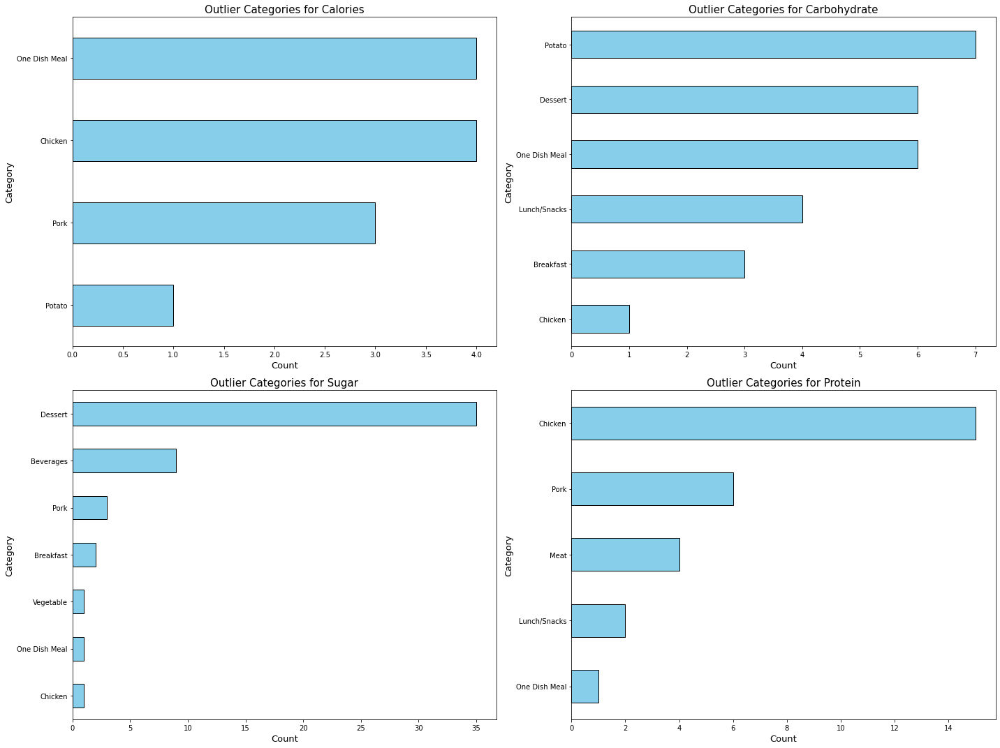

In [31]:
# Plot bar plots for each feature to display the categories of the identified outliers
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(20, 15))

features = ["calories", "carbohydrate", "sugar", "protein"]
axis_mapping = {(0, 0): "calories", (0, 1): "carbohydrate", (1, 0): "sugar", (1, 1): "protein"}

for ax_coords, feature in axis_mapping.items():
    ax = axes[ax_coords]
    outlier_categories[feature].sort_values(ascending=True).plot(kind='barh', ax=ax, color='skyblue', edgecolor='black')
    ax.set_title(f'Outlier Categories for {feature.capitalize()}', fontsize=15)
    ax.set_xlabel('Count', fontsize=13)
    ax.set_ylabel('Category', fontsize=13)

plt.tight_layout()
plt.show()


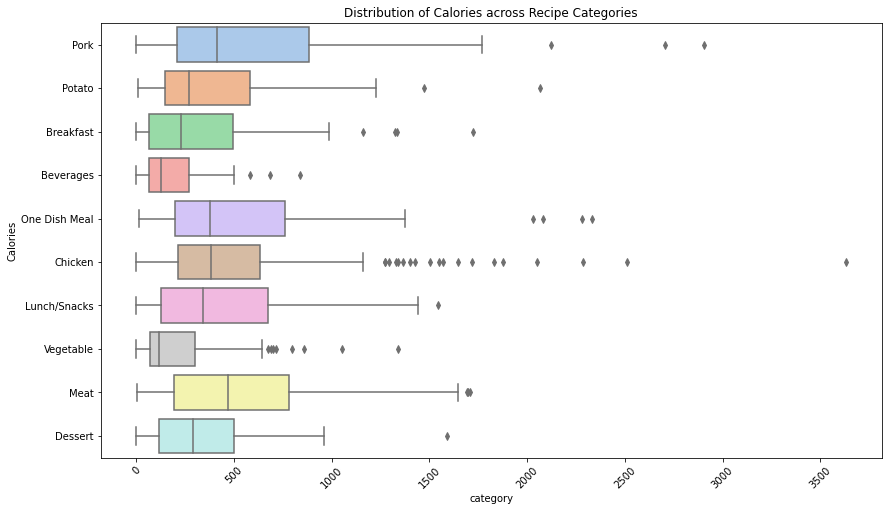

In [32]:
# Box plot for 'calories' across different 'categories'
plt.figure(figsize=(14, 8))
sns.boxplot(y=df['category'], x=df['calories'], palette="pastel")
plt.title('Distribution of Calories across Recipe Categories')
plt.xlabel('category')
plt.ylabel('Calories')
plt.xticks(rotation=45)
plt.show()

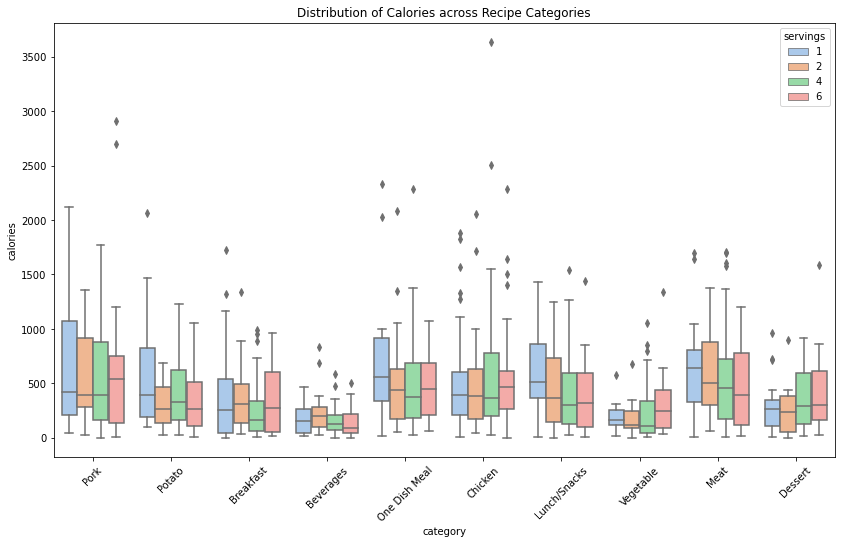

In [33]:
# Box plot for 'calories' across different 'categories'
plt.figure(figsize=(14, 8))
sns.boxplot(x=df['category'], y=df['calories'], hue = df['servings'], palette="pastel")
plt.title('Distribution of Calories across Recipe Categories')
plt.xlabel('category')
plt.ylabel('calories')
plt.xticks(rotation=45)
plt.show()

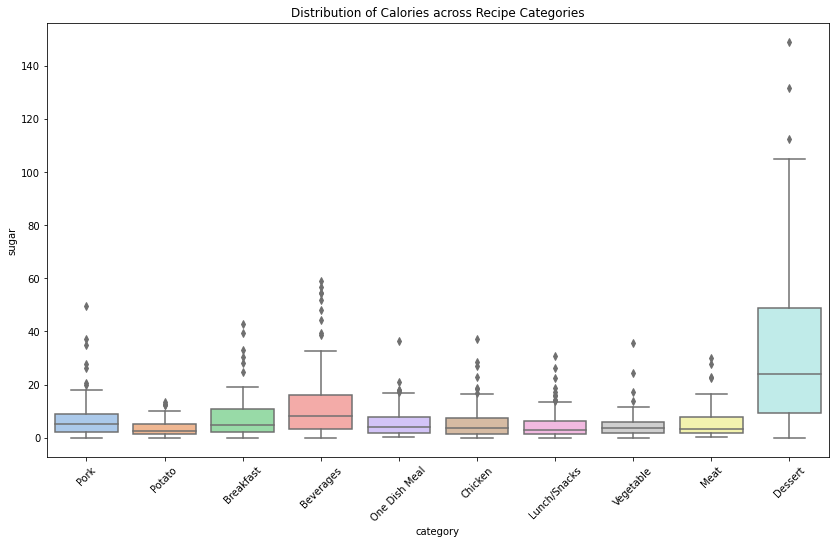

In [34]:
# Box plot for 'calories' across different 'categories'
plt.figure(figsize=(14, 8))
sns.boxplot(x=df['category'], y=df['sugar'], palette="pastel")
plt.title('Distribution of Calories across Recipe Categories')
plt.xlabel('category')
plt.ylabel('sugar')
plt.xticks(rotation=45)
plt.show()

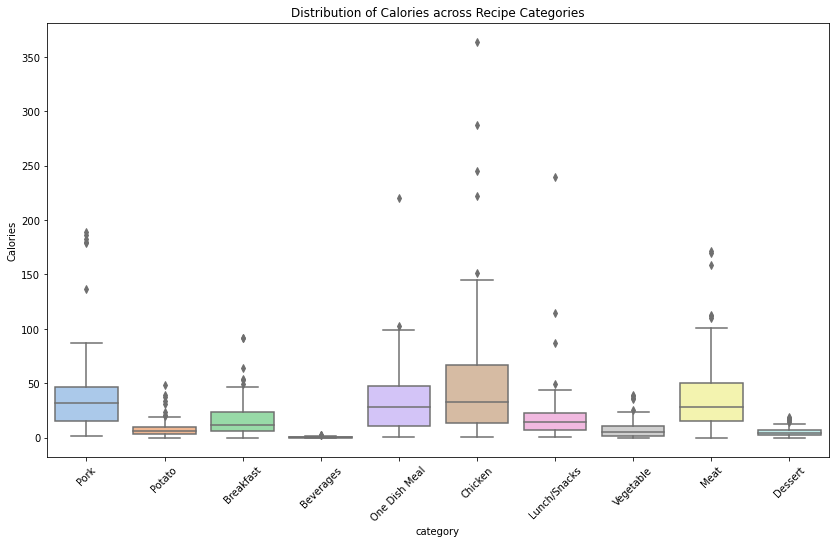

In [35]:
# Box plot for 'calories' across different 'categories'
plt.figure(figsize=(14, 8))
sns.boxplot(x=df['category'], y=df['protein'], palette="pastel")
plt.title('Distribution of Calories across Recipe Categories')
plt.xlabel('category')
plt.ylabel('Calories')
plt.xticks(rotation=45)
plt.show()

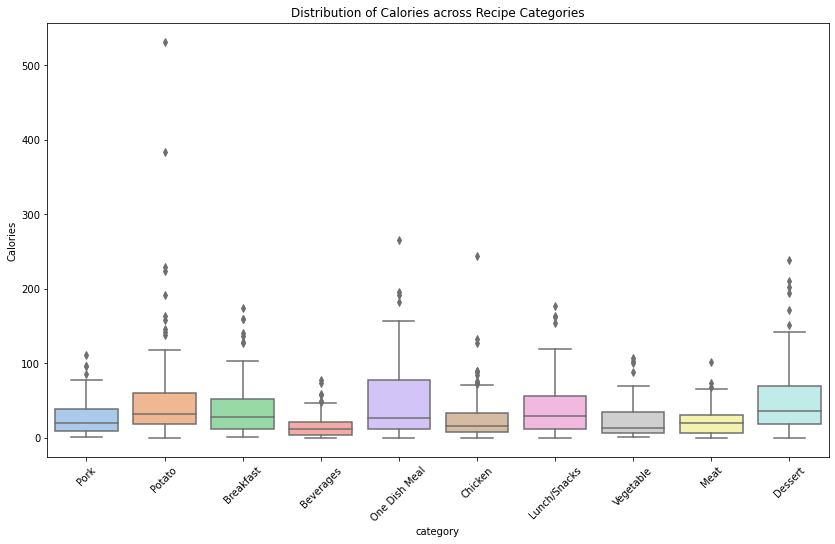

In [36]:
# Box plot for 'calories' across different 'categories'
plt.figure(figsize=(14, 8))
sns.boxplot(x=df['category'], y=df['carbohydrate'], palette="pastel")
plt.title('Distribution of Calories across Recipe Categories')
plt.xlabel('category')
plt.ylabel('Calories')
plt.xticks(rotation=45)
plt.show()

<AxesSubplot:title={'center':'Count plot category by traffic'}, xlabel='category', ylabel='count'>

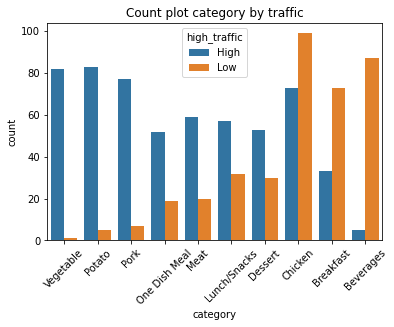

In [37]:
# get countplot to check relationship between high traffic and category
plt.title('Count plot category by traffic')
plt.figsize=(15,15)
plt.xticks(rotation=45)
sns.countplot(x=df['category'].sort_values(ascending=False), hue =df['high_traffic'])

Box Plot for Calories across Categories:

The "Meat" category tends to have the highest median caloric content, with a broad interquartile range, indicating a wide variety of meat dishes in terms of their caloric content.
"Beverages" have the lowest median caloric content, which is expected since drinks typically have fewer calories than solid foods.
There's noticeable variation in caloric content within categories like "One Dish Meal", "Chicken", and "Dessert", as indicated by the widths of their boxes and the lengths of their whiskers.

#The servings column has been cleaned, and it now contains only the numerical values: 

<AxesSubplot:xlabel='servings', ylabel='count'>

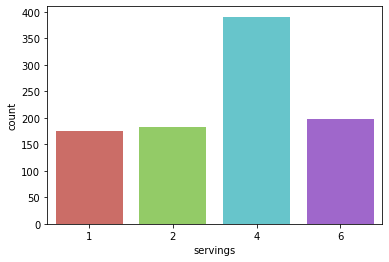

In [38]:
# servings plot
sns.countplot(x='servings', data=df, palette='hls')

<AxesSubplot:xlabel='servings'>

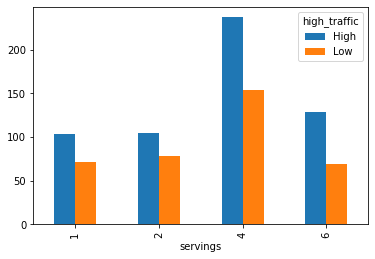

In [39]:
#bar chart of servings with high traffic
pd.crosstab(df.servings, df.high_traffic).plot(kind='bar')

# pivot for median values group by category, servings


In [40]:
#check for missing values
df.isnull().sum()

calories        0
carbohydrate    0
sugar           0
protein         0
category        0
servings        0
high_traffic    0
healthy         0
difficulty      0
dtype: int64

In [41]:
#Import the PowerTransformer
from sklearn.preprocessing import PowerTransformer
pt = PowerTransformer(method='yeo-johnson')
df[['pt_calories', 'pt_carbohydrate', 'pt_sugar', 'pt_protein']] = pt.fit_transform(df[['calories', 'carbohydrate', 'sugar', 'protein']])


In [42]:
df.columns

Index(['calories', 'carbohydrate', 'sugar', 'protein', 'category', 'servings',
       'high_traffic', 'healthy', 'difficulty', 'pt_calories',
       'pt_carbohydrate', 'pt_sugar', 'pt_protein'],
      dtype='object')

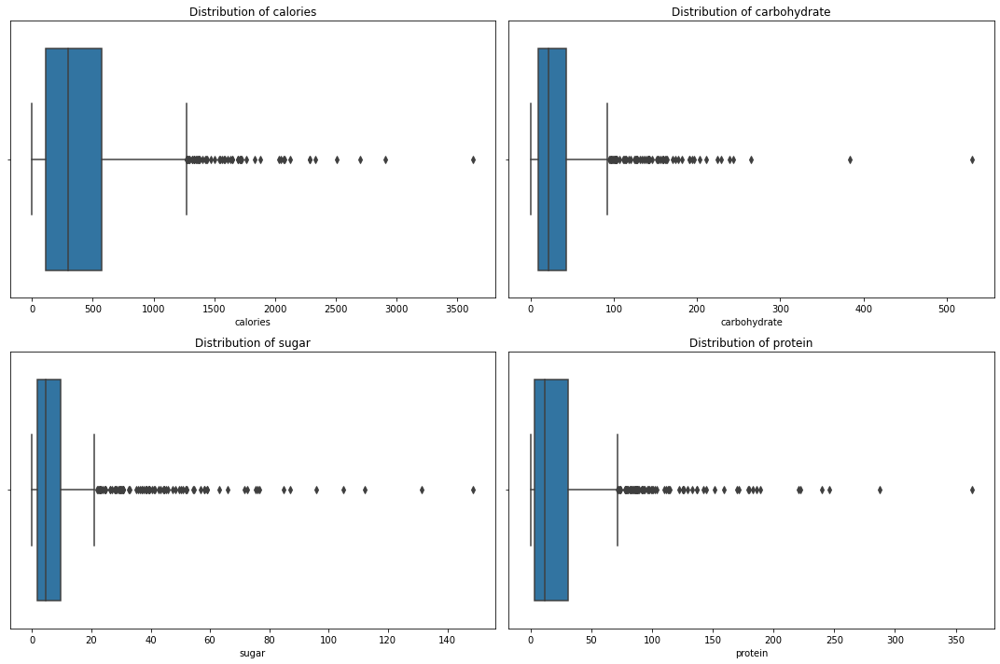

In [43]:
import seaborn as sns
import matplotlib.pyplot as plt

# Columns to visualize for potential outliers
columns_to_check = ['calories', 'carbohydrate', 'sugar', 'protein']

plt.figure(figsize=(15, 10))
for i, col in enumerate(columns_to_check, 1):
    plt.subplot(2, 2, i)
    sns.boxplot(x=df[col])
    plt.title(f'Distribution of {col}')

plt.tight_layout()
plt.show()

The boxplots clearly indicate the presence of outliers in the columns calories, carbohydrate, sugar, and protein. These outliers could potentially be the cause of the error when trying to standardize the data.

To handle these outliers, we can employ one of the following strategies:

Capping: Replace outlier values with the boundary values (either the 1st or 3rd quartile values depending on whether it's a lower or upper outlier).
Transformation: Apply transformations like log transformation to reduce the effect of outliers.
Removal: Remove records with outlier values.
Given the importance of not losing data, especially in this context where we are trying to predict high traffic recipes, I recommend using the capping method. This method will ensure we retain all records while minimizing the influence of extreme values.



In [44]:
df.shape

(947, 13)

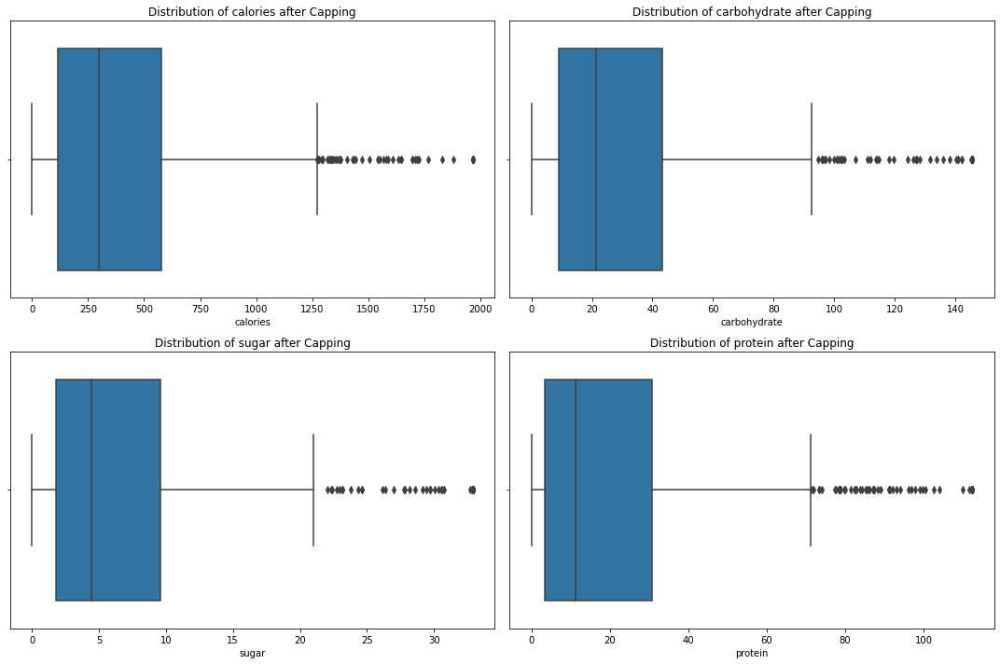

In [45]:
# Capping outliers based on the IQR method
for col in columns_to_check:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 3 * IQR
    upper_bound = Q3 + 3 * IQR
    
    # Replace outliers with boundary values
    df[col] = np.where(df[col] < lower_bound, lower_bound, df[col])
    df[col] = np.where(df[col] > upper_bound, upper_bound, df[col])

# Visualize the distributions after capping
plt.figure(figsize=(15, 10))
for i, col in enumerate(columns_to_check, 1):
    plt.subplot(2, 2, i)
    sns.boxplot(x=df[col])
    plt.title(f'Distribution of {col} after Capping')

plt.tight_layout()
plt.show()


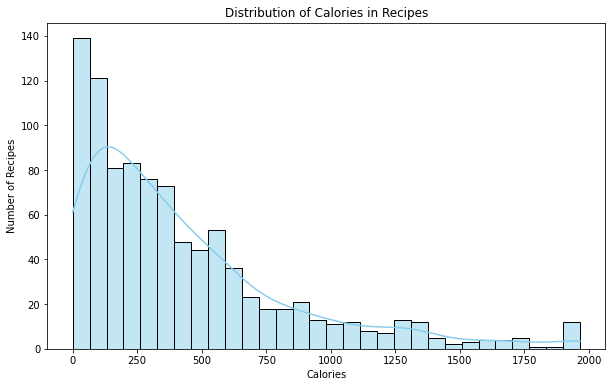

In [46]:
#show histogram of calories
plt.figure(figsize=(10, 6))
sns.histplot(df['calories'], kde=True, bins=30, color='skyblue')
plt.title('Distribution of Calories in Recipes')
plt.xlabel('Calories')
plt.ylabel('Number of Recipes')
plt.show()

# <a id='toc4_'></a>[log transformation of 'calories', 'sugar','carbohydrate','protein'](#toc0_)
df['log_calories'] = np.log(df['calories'])# remove
df['log_sugar'] = np.log(df['sugar']) # remove
df['log_carbohydrates'] = np.log(df['carbohydrate'])
df['log_protein'] = np.log1p(df['protein'])


In [47]:
# test for normality
from scipy.stats import shapiro

# Testing for normality 'log_calories', 'log_sugar'
columns_to_test = ['pt_calories', 'pt_carbohydrate', 'pt_sugar', 'pt_protein']

for column in columns_to_test:
    stat, p = shapiro(df[column])
    print(f"Shapiro-Wilk Test for {column}:")
    print(f"Statistic = {stat:.5f}, p-value = {p:.5f}")
    if p > 0.05:
        print(f"{column} looks Gaussian (fail to reject H0)\n")
    else:
        print(f"{column} does not look Gaussian (reject H0)\n")

Shapiro-Wilk Test for pt_calories:
Statistic = 0.99759, p-value = 0.18081
pt_calories looks Gaussian (fail to reject H0)

Shapiro-Wilk Test for pt_carbohydrate:
Statistic = 0.99681, p-value = 0.05449
pt_carbohydrate looks Gaussian (fail to reject H0)

Shapiro-Wilk Test for pt_sugar:
Statistic = 0.99116, p-value = 0.00002
pt_sugar does not look Gaussian (reject H0)

Shapiro-Wilk Test for pt_protein:
Statistic = 0.98214, p-value = 0.00000
pt_protein does not look Gaussian (reject H0)



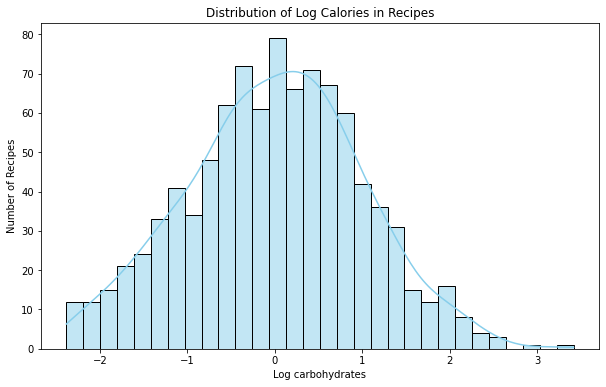

In [48]:
# Histogram for 'log_calories'
plt.figure(figsize=(10, 6))
sns.histplot(df['pt_carbohydrate'], kde=True, bins=30, color='skyblue')
plt.title('Distribution of Log Calories in Recipes')
plt.xlabel('Log carbohydrates')
plt.ylabel('Number of Recipes')
plt.show()

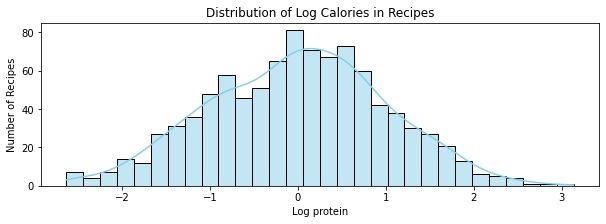

In [49]:
# Histogram for 'log_calories'
plt.figure(figsize=(10, 3))
sns.histplot(df['pt_calories'], kde=True, bins=30, color='skyblue')
plt.title('Distribution of Log Calories in Recipes')
plt.xlabel('Log protein')
plt.ylabel('Number of Recipes')
plt.show()

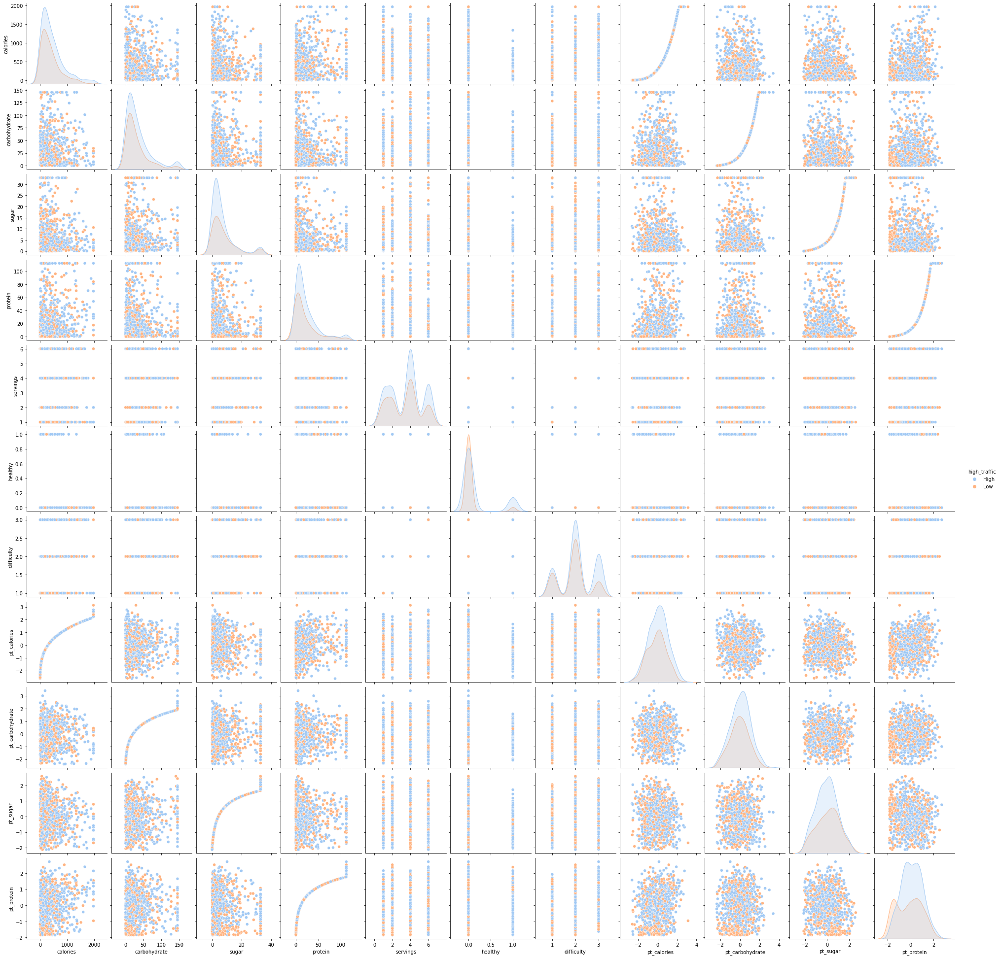

In [50]:
#searborn pairplot
sns.pairplot(df, hue = 'high_traffic', palette="pastel")
plt.show()

In [51]:
df.columns

Index(['calories', 'carbohydrate', 'sugar', 'protein', 'category', 'servings',
       'high_traffic', 'healthy', 'difficulty', 'pt_calories',
       'pt_carbohydrate', 'pt_sugar', 'pt_protein'],
      dtype='object')

In [52]:
# use statistcal test t-test to compare means of high traffic and low traffic in calories, carbohydrates, sugar, and protein
from scipy.stats import ttest_ind

# t-test for 'calories'
high_traffic_calories = df[df['high_traffic'] == 'High']['pt_calories']
low_traffic_calories = df[df['high_traffic'] == 'Low']['pt_calories']

ttest_ind(high_traffic_calories, low_traffic_calories)

# t-test for 'carbohydrate'
high_traffic_carbohydrate = df[df['high_traffic'] == 'High']['pt_carbohydrate']
low_traffic_carbohydrate = df[df['high_traffic'] == 'Low']['pt_carbohydrate']

ttest_ind(high_traffic_carbohydrate, low_traffic_carbohydrate)

# t-test for 'sugar'
high_traffic_sugar = df[df['high_traffic'] == 'High']['pt_sugar']
low_traffic_sugar = df[df['high_traffic'] == 'Low']['pt_sugar']

ttest_ind(high_traffic_sugar, low_traffic_sugar)

# t-test for 'protein'
high_traffic_protein = df[df['high_traffic'] == 'High']['pt_protein']
low_traffic_protein = df[df['high_traffic'] == 'Low']['pt_protein']

ttest_ind(high_traffic_protein, low_traffic_protein)

# print t-statistic and p-value for each variable
print('Calories: ', ttest_ind(high_traffic_calories, low_traffic_calories))
print('Carbohydrate: ', ttest_ind(high_traffic_carbohydrate, low_traffic_carbohydrate))
print('Sugar: ', ttest_ind(high_traffic_sugar, low_traffic_sugar))
print('Protein: ', ttest_ind(high_traffic_protein, low_traffic_protein))

Calories:  Ttest_indResult(statistic=2.120008075196389, pvalue=0.03426545275167098)
Carbohydrate:  Ttest_indResult(statistic=1.8359670501893204, pvalue=0.06667656969140213)
Sugar:  Ttest_indResult(statistic=-2.1287639520086867, pvalue=0.033531887461252456)
Protein:  Ttest_indResult(statistic=3.834075331148166, pvalue=0.00013438519941240572)


In [53]:
from scipy.stats import chi2_contingency,ttest_ind

contingency_table = pd.crosstab(df['category'], df['high_traffic'])
chi2, p, dof, expected = chi2_contingency(contingency_table)
chi2, p

(318.2935223075692, 3.417304408371102e-63)

the chi-squared statistic is 300.1309861002327, and the p-value below 0.05  means that we can reject the null hypothesis and conclude that there is a significant association between the category of the recipe and the level of traffic to the website when the recipe was shown.

as you will see in the following plot that shows the number of recipes that belong to each category and whether they have high traffic or not. From this plot, we can conclude that there is a strong association between the category and high_traffic variables

In [54]:
contingency_table = pd.crosstab(df['servings'], df['high_traffic'])
chi2, p, dof, expected = chi2_contingency(contingency_table)
chi2, p

(2.7369889309788054, 0.4339779666711946)

From the following plot and the p-value there is not significant association between the servings and the high traffic data

Model Fitting & Evaluation
It's clear that this is a classification problem. The target variable, high_traffic, is binary, indicating whether a recipe will lead to high traffic or not.

For the evaluation, I chose  Accuracy: This measures the proportion of correct predictions in the total predictions made. Given the goal of predicting high traffic recipes correctly 80% of the time, accuracy will be a primary metric of interest.

Approximately 59.78% of the recipes do not lead to high traffic (Class 0).

Approximately 40.22% of the recipes lead to high traffic (Class 1).

While there is a slight imbalance, it's not extremely skewed. However, even this degree of imbalance can sometimes lead to biased model predictions, especially if the model ends up favoring the majority class.

In [55]:
df

,calories,carbohydrate,sugar,protein,category,servings,high_traffic,healthy,difficulty,pt_calories,pt_carbohydrate,pt_sugar,pt_protein
recipe,,,,,,,,,,,,,
1,538.520,11.830,2.530,35.120,Pork,6,High,0,3,0.591941,-0.460275,-0.443192,0.869824
2,35.480,38.560,0.660,0.920,Potato,4,High,0,2,-1.430245,0.565080,-1.401033,-1.370566
3,914.280,42.680,3.090,2.880,Breakfast,1,Low,0,1,1.178291,0.660862,-0.273403,-0.844706
4,97.030,30.560,32.875,0.020,Beverages,4,High,0,2,-0.842690,0.350121,1.774690,-1.837446
5,27.050,1.850,0.800,0.530,Beverages,4,Low,0,2,-1.563160,-1.664064,-1.290780,-1.538804
...,...,...,...,...,...,...,...,...,...,...,...,...,...
943,1161.000,5.310,22.390,44.220,Lunch/Snacks,2,Low,0,2,1.469982,-1.050371,1.382688,1.046531
944,267.605,32.045,2.520,5.145,Potato,2,High,0,1,-0.070571,0.393481,-0.446515,-0.497223
945,951.740,29.420,3.570,13.870,Pork,2,High,0,2,1.226086,0.315569,-0.148890,0.179130


In [56]:
import pandas as pd
from sklearn.preprocessing import PolynomialFeatures


In [57]:
df

,calories,carbohydrate,sugar,protein,category,servings,high_traffic,healthy,difficulty,pt_calories,pt_carbohydrate,pt_sugar,pt_protein
recipe,,,,,,,,,,,,,
1,538.520,11.830,2.530,35.120,Pork,6,High,0,3,0.591941,-0.460275,-0.443192,0.869824
2,35.480,38.560,0.660,0.920,Potato,4,High,0,2,-1.430245,0.565080,-1.401033,-1.370566
3,914.280,42.680,3.090,2.880,Breakfast,1,Low,0,1,1.178291,0.660862,-0.273403,-0.844706
4,97.030,30.560,32.875,0.020,Beverages,4,High,0,2,-0.842690,0.350121,1.774690,-1.837446
5,27.050,1.850,0.800,0.530,Beverages,4,Low,0,2,-1.563160,-1.664064,-1.290780,-1.538804
...,...,...,...,...,...,...,...,...,...,...,...,...,...
943,1161.000,5.310,22.390,44.220,Lunch/Snacks,2,Low,0,2,1.469982,-1.050371,1.382688,1.046531
944,267.605,32.045,2.520,5.145,Potato,2,High,0,1,-0.070571,0.393481,-0.446515,-0.497223
945,951.740,29.420,3.570,13.870,Pork,2,High,0,2,1.226086,0.315569,-0.148890,0.179130


In [58]:
# convert with one hot encoding category,servings, high_traffic, use 0 and 1
df = pd.get_dummies(df, columns=['category', 'high_traffic'], drop_first=False)
df.head()

,calories,carbohydrate,sugar,protein,servings,healthy,difficulty,pt_calories,pt_carbohydrate,pt_sugar,...,category_Chicken,category_Dessert,category_Lunch/Snacks,category_Meat,category_One Dish Meal,category_Pork,category_Potato,category_Vegetable,high_traffic_High,high_traffic_Low
recipe,,,,,,,,,,,,,,,,,,,,,
1,538.52,11.83,2.530,35.12,6,0,3,0.591941,-0.460275,-0.443192,...,0,0,0,0,0,1,0,0,1,0
2,35.48,38.56,0.660,0.92,4,0,2,-1.430245,0.565080,-1.401033,...,0,0,0,0,0,0,1,0,1,0
3,914.28,42.68,3.090,2.88,1,0,1,1.178291,0.660862,-0.273403,...,0,0,0,0,0,0,0,0,0,1
4,97.03,30.56,32.875,0.02,4,0,2,-0.842690,0.350121,1.774690,...,0,0,0,0,0,0,0,0,1,0
5,27.05,1.85,0.800,0.53,4,0,2,-1.563160,-1.664064,-1.290780,...,0,0,0,0,0,0,0,0,0,1


In [59]:
# replace False with 0 and True with 1 on all columns
df = df.replace(False, 0)
df = df.replace(True, 1)

In [60]:
#rename high_traffic_Low to high_traffic
df.rename(columns={'high_traffic_Low': 'high_traffic'}, inplace=True)

In [61]:
df.head()

,calories,carbohydrate,sugar,protein,servings,healthy,difficulty,pt_calories,pt_carbohydrate,pt_sugar,...,category_Chicken,category_Dessert,category_Lunch/Snacks,category_Meat,category_One Dish Meal,category_Pork,category_Potato,category_Vegetable,high_traffic_High,high_traffic
recipe,,,,,,,,,,,,,,,,,,,,,
1,538.52,11.83,2.530,35.12,6,0,3,0.591941,-0.460275,-0.443192,...,0,0,0,0,0,1,0,0,1,0
2,35.48,38.56,0.660,0.92,4,0,2,-1.430245,0.565080,-1.401033,...,0,0,0,0,0,0,1,0,1,0
3,914.28,42.68,3.090,2.88,1,0,1,1.178291,0.660862,-0.273403,...,0,0,0,0,0,0,0,0,0,1
4,97.03,30.56,32.875,0.02,4,0,2,-0.842690,0.350121,1.774690,...,0,0,0,0,0,0,0,0,1,0
5,27.05,1.85,0.800,0.53,4,0,2,-1.563160,-1.664064,-1.290780,...,0,0,0,0,0,0,0,0,0,1


In [62]:
#drop high_traffic_High
df.drop(columns=['high_traffic_High'], inplace=True)

In [63]:
#check for missing values
df.isnull().sum()

calories                  0
carbohydrate              0
sugar                     0
protein                   0
servings                  0
healthy                   0
difficulty                0
pt_calories               0
pt_carbohydrate           0
pt_sugar                  0
pt_protein                0
category_Beverages        0
category_Breakfast        0
category_Chicken          0
category_Dessert          0
category_Lunch/Snacks     0
category_Meat             0
category_One Dish Meal    0
category_Pork             0
category_Potato           0
category_Vegetable        0
high_traffic              0
dtype: int64

In [64]:
# drop calroies, sugar, carbohydrate, protein
#df.drop(['calories', 'sugar', 'carbohydrate', 'protein'], axis=1, inplace=True)

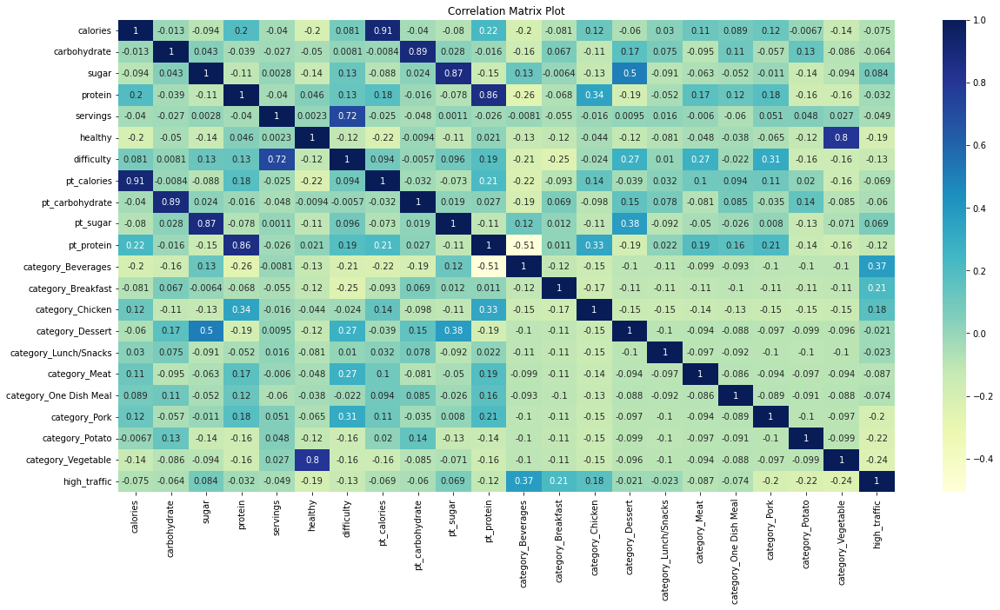

In [65]:
# show correlation matrix plot of all variables
plt.figure(figsize=(20, 10))
sns.heatmap(df.corr(), annot=True, cmap="YlGnBu")
plt.title("Correlation Matrix Plot")
plt.show()


In [66]:
# aboslute high correlation  values with 'high_traffic' above abs values 0.001
high_corr = df.corr()['high_traffic'].abs().sort_values(ascending=False)
high_corr = high_corr[high_corr > 0.001]
high_corr




high_traffic              1.000000
category_Beverages        0.370437
category_Vegetable        0.242208
category_Potato           0.220794
category_Breakfast        0.214204
category_Pork             0.198287
healthy                   0.189304
category_Chicken          0.175195
difficulty                0.134022
pt_protein                0.123764
category_Meat             0.086880
sugar                     0.083914
calories                  0.075178
category_One Dish Meal    0.073573
pt_sugar                  0.069083
pt_calories               0.068800
carbohydrate              0.064388
pt_carbohydrate           0.059618
servings                  0.048708
protein                   0.031574
category_Lunch/Snacks     0.022626
category_Dessert          0.020571
Name: high_traffic, dtype: float64

In [67]:
# find the most important features relative to target with SelectKBest

X = df.drop('high_traffic', axis=1)
y = df['high_traffic']


In [68]:
# check missisng values
X.isnull().sum()

calories                  0
carbohydrate              0
sugar                     0
protein                   0
servings                  0
healthy                   0
difficulty                0
pt_calories               0
pt_carbohydrate           0
pt_sugar                  0
pt_protein                0
category_Beverages        0
category_Breakfast        0
category_Chicken          0
category_Dessert          0
category_Lunch/Snacks     0
category_Meat             0
category_One Dish Meal    0
category_Pork             0
category_Potato           0
category_Vegetable        0
dtype: int64

/Users/stephaniegessler/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


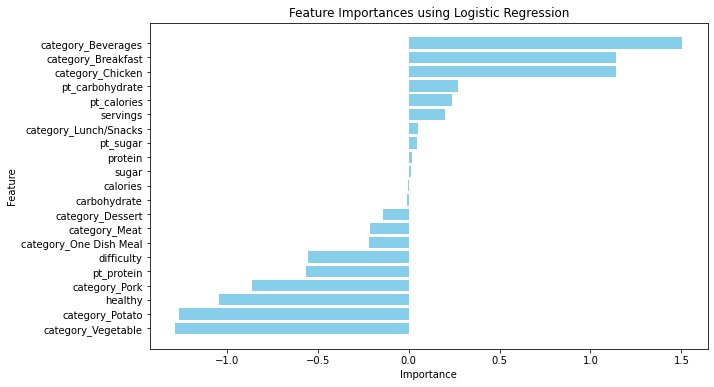

In [69]:
# Feature importance with logistic classifier
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFE

# Initialize the logistic regression
logreg = LogisticRegression()

# Fit the model
logreg.fit(X, y)

# Get the feature importances
feature_importances = logreg.coef_[0]

# Create a DataFrame for visualization
features_df = pd.DataFrame({
    'Feature': X.columns,
    'Importance': feature_importances
})

# Sort the DataFrame by importance
features_df = features_df.sort_values(by='Importance', ascending=False)

# Plot the feature importances
plt.figure(figsize=(10,6))
plt.barh(features_df['Feature'], features_df['Importance'], color='skyblue')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importances using Logistic Regression')
plt.gca().invert_yaxis()  # Highest importances at the top
plt.show()


In [70]:
# rank all features in a table in absolute order of importance from the previous model
features_df['Importance'] = abs(features_df['Importance'])
features_df = features_df.sort_values(by='Importance', ascending=False)
features_df

,Feature,Importance
11,category_Beverages,1.504977
20,category_Vegetable,1.283691
19,category_Potato,1.260267
12,category_Breakfast,1.140767
13,category_Chicken,1.140358
5,healthy,1.044516
18,category_Pork,0.859301
10,pt_protein,0.563035
6,difficulty,0.555451
8,pt_carbohydrate,0.269301


In [71]:
# Drop  log_protein, log_carbohydrates, sugar, log_calories,  'carbohydrate', 'sugar'
df.drop([ 'protein','carbohydrate','sugar','calories'], axis=1, inplace=True)

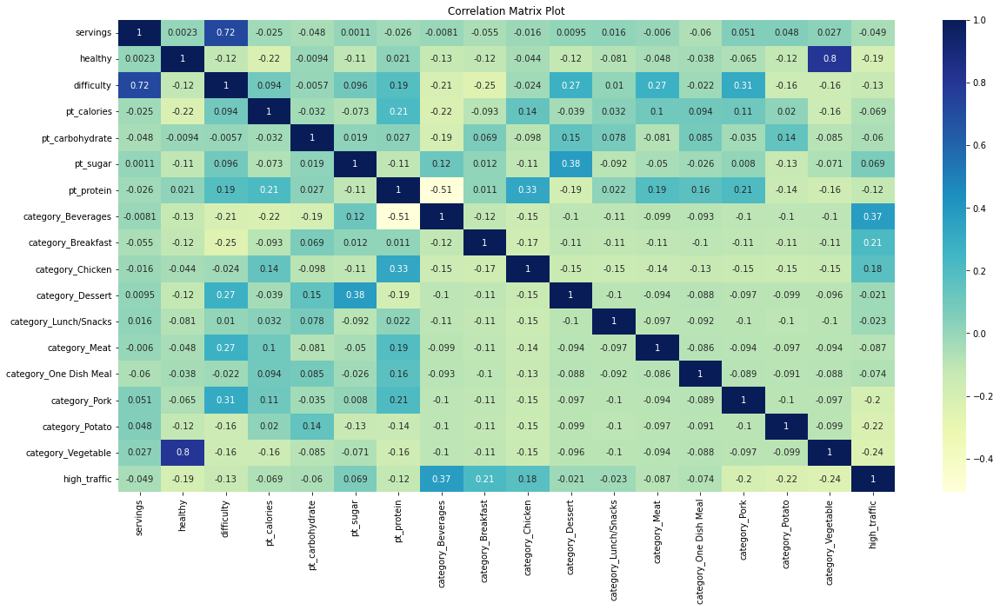

In [72]:
# show correlation matrix plot of all variables
plt.figure(figsize=(20, 10))
sns.heatmap(df.corr(), annot=True, cmap="YlGnBu")
plt.title("Correlation Matrix Plot")
plt.show()

In [73]:
#Use sharply to see the best features


In [74]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 947 entries, 1 to 947
Data columns (total 18 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   servings                947 non-null    int64  
 1   healthy                 947 non-null    int64  
 2   difficulty              947 non-null    int64  
 3   pt_calories             947 non-null    float64
 4   pt_carbohydrate         947 non-null    float64
 5   pt_sugar                947 non-null    float64
 6   pt_protein              947 non-null    float64
 7   category_Beverages      947 non-null    uint8  
 8   category_Breakfast      947 non-null    uint8  
 9   category_Chicken        947 non-null    uint8  
 10  category_Dessert        947 non-null    uint8  
 11  category_Lunch/Snacks   947 non-null    uint8  
 12  category_Meat           947 non-null    uint8  
 13  category_One Dish Meal  947 non-null    uint8  
 14  category_Pork           947 non-null    ui

In [75]:
#remove servings_2,servings_4,servings_6
#df.drop(['servings_6'], axis=1, inplace=True)

# <a id='toc5_'></a>[Model Fitting and Evaluation](#toc0_)

Predicting whether a recipe will lead to high traffic is a binary classification problem in machine learning. Given the nature of our dataset and the need for interpretability, I am choosing the Logistic Regression model. Logistic Regression is suitable for binary outcomes and provides probabilities that can be interpreted and calibrated. The model also works well when there's a linear decision boundary between classes.

As a comparison model, I'm selecting the Random Forest classifier. Random Forest is an ensemble method that can capture complex relationships in the data without needing explicit feature engineering. It's robust to outliers and can handle imbalanced datasets by adjusting class weights or through bootstrapping.

For evaluation, given the class imbalance and the nature of our problem, I'm prioritizing the F1-Score and ROC-AUC. The F1-Score provides a balance between precision and recall, making it a more comprehensive metric than accuracy for imbalanced datasets. ROC-AUC, on the other hand, gives us insights into the model's capability to distinguish between recipes that lead to high traffic and those that don't. Additionally, we'll also monitor Accuracy, Precision, and Recall to ensure our model's predictions are both precise and comprehensive.

This text is adapted to describe the problem at hand, the chosen models, and the rationale behind the model choices and evaluation metrics.

# <a id='toc6_'></a>[Prepare Data for Modelling](#toc0_)
To facilitate the prediction of whether a recipe will lead to high traffic, we selected features like calories, sugar, carbohydrates, and protein among others, with high_traffic as the target variable. To further refine our dataset for modeling, the following transformations were applied:

Standardization of Numeric Features: Given the varied scales of our numeric features, we standardized them to have a mean of 0 and a standard deviation of 1. This ensures that all features contribute equally to the model's performance.

Encoding Categorical Variables: Any categorical variables in our dataset were converted into numeric representations, ensuring our models can process them effectively.

Data Splitting: To evaluate our model's performance on unseen data, we split the dataset into a training set (to train the model) and a test set (to evaluate the model).



In [76]:
#import standard scaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

#import train test split
from sklearn.model_selection import train_test_split

# Split the data into training and test sets
X = df.drop('high_traffic', axis=1)
y = df['high_traffic']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)

# Standardize the features
#scaler = StandardScaler()
scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [77]:
# Get the value counts for each class
class_counts = y.value_counts()

# Calculate the percentage distribution of each class
class_percentage = (class_counts / len(y)) * 100
class_percentage

0    60.61246
1    39.38754
Name: high_traffic, dtype: float64

In [78]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
# Esemble model , measure F1 score, precious, recall, accuracy
from sklearn.metrics import f1_score, precision_score, recall_score, accuracy_score

# Initialize and fit the baseline model: Logistic Regression
logreg = LogisticRegression(class_weight='balanced',penalty='l2',C=0.001)
logreg.fit(X_train, y_train)

# Predict on the test set
y_pred_baseline = logreg.predict(X_test)

# Evaluate the performance of the baseline model
accuracy_baseline = f1_score(y_test, y_pred_baseline)
accuracy_baseline

0.6507936507936508

In [79]:
from sklearn.model_selection import cross_val_score
from sklearn.metrics import make_scorer

# Define the metrics
scoring_metrics = {
    'f1': 'f1',
    'f1_weighted': 'f1_weighted',
    'roc_auc': 'roc_auc',
    'neg_log_loss': 'neg_log_loss',
    'accuracy': 'accuracy',
    'precision': 'precision',
    'recall': 'recall',
    'auc': 'roc_auc'
}

# Evaluate the model using cross-validation
scores = {}
for metric_name, metric in scoring_metrics.items():
    cv_score = cross_val_score(logreg, X_train, y_train, cv=5, scoring=metric)
    scores[metric_name] = cv_score.mean()

scores


{'f1': 0.6746910875867227,
 'f1_weighted': 0.7389810616978434,
 'roc_auc': 0.8181747567596623,
 'neg_log_loss': -0.6871788885231565,
 'accuracy': 0.7387673729778992,
 'precision': 0.6643865278168684,
 'recall': 0.6894049346879536,
 'auc': 0.8181747567596623}

In [80]:
# check classifcation model
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred_baseline))


              precision    recall  f1-score   support

           0       0.79      0.66      0.72       173
           1       0.59      0.73      0.65       112

    accuracy                           0.69       285
   macro avg       0.69      0.70      0.69       285
weighted avg       0.71      0.69      0.69       285



In [81]:
# build model 'LinearSVC' and measure F1 score, precious, recall, accuracy using cross validation
from sklearn.svm import LinearSVC

# Initialize and fit the model
lsvc = LinearSVC(class_weight='balanced')
lsvc.fit(X_train, y_train)

# Predict on the test set
y_pred_lsvc = lsvc.predict(X_test)

# Evaluate the performance of the model
accuracy_lsvc = f1_score(y_test, y_pred_lsvc)
accuracy_lsvc

# Evaluate the model using cross-validation
scores = {}
for metric_name, metric in scoring_metrics.items():
    cv_score = cross_val_score(lsvc, X_train, y_train, cv=5, scoring=metric)
    scores[metric_name] = cv_score.mean()

scores

# check classifcation model
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred_lsvc))



              precision    recall  f1-score   support

           0       0.84      0.59      0.69       173
           1       0.57      0.83      0.67       112

    accuracy                           0.68       285
   macro avg       0.71      0.71      0.68       285
weighted avg       0.73      0.68      0.69       285



/Users/stephaniegessler/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/stephaniegessler/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/stephaniegessler/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "/Users/stephaniegessler/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_scorer.py", line 277, in _score
    y_pred = method_caller(clf, "predict_proba", X)
  File "/Users/stephaniegessler/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
AttributeError: 'Linea

In [82]:
# bernoulli naive bayes classifier
from sklearn.naive_bayes import BernoulliNB
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold

# define model
model = BernoulliNB(alpha=0.255)
# define evaluation procedure
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=42)
# evaluate model
scores = cross_val_score(model, X, y, scoring='f1', cv=cv, n_jobs=-1)
# summarize performance
print('Mean F1: %.3f' % np.mean(scores))

#predict on test set
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

# check classifcation model
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))


<frozen importlib._bootstrap>:228: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject
<frozen importlib._bootstrap>:228: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject
<frozen importlib._bootstrap>:228: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject
<frozen importlib._bootstrap>:228: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject
<frozen importlib._bootstrap>:228: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject
<frozen importlib._bootstrap>:228: RuntimeWarning: scip

Mean F1: 0.674
              precision    recall  f1-score   support

           0       0.78      0.77      0.78       173
           1       0.65      0.66      0.66       112

    accuracy                           0.73       285
   macro avg       0.72      0.72      0.72       285
weighted avg       0.73      0.73      0.73       285



In [83]:
#SDG classifier
from sklearn.linear_model import SGDClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold

# define model
model = SGDClassifier()
# define evaluation procedure
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=42)
# evaluate model
scores = cross_val_score(model, X, y, scoring='f1', cv=cv, n_jobs=-1)
# summarize performance
print('Mean F1: %.3f' % np.mean(scores))

#predict on test set
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

# check classifcation model
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))


Mean F1: 0.606
              precision    recall  f1-score   support

           0       0.68      0.97      0.80       173
           1       0.85      0.30      0.45       112

    accuracy                           0.71       285
   macro avg       0.77      0.63      0.62       285
weighted avg       0.75      0.71      0.66       285



In [84]:
# Build a model with ExtraTreesClassifier
from sklearn.ensemble import ExtraTreesClassifier

from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold

# define model
model = ExtraTreesClassifier(n_estimators=250)
# define evaluation procedure
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=42)
# evaluate model
scores = cross_val_score(model, X, y, scoring='f1', cv=cv, n_jobs=-1)
# summarize performance
print('Mean F1: %.3f' % np.mean(scores))

#predict on test set
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

# check classifcation model
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))



Mean F1: 0.649
              precision    recall  f1-score   support

           0       0.74      0.72      0.73       173
           1       0.58      0.62      0.60       112

    accuracy                           0.68       285
   macro avg       0.66      0.67      0.66       285
weighted avg       0.68      0.68      0.68       285



In [85]:
importances = model.feature_importances_

In [86]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV


rf=RandomForestClassifier()
param_grid = {'n_estimators': [10, 50, 100,150,200],
              'max_depth': [None, 5, 10]
              }
gs=GridSearchCV(rf,param_grid)
gs.fit(X_train,y_train)

GridSearchCV(estimator=RandomForestClassifier(),
             param_grid={'max_depth': [None, 5, 10],
                         'n_estimators': [10, 50, 100, 150, 200]})

In [87]:
# check best parameters
gs.best_params_

{'max_depth': 5, 'n_estimators': 150}

In [88]:
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score

y_pred = gs.predict(X_test)
acc = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

print("confussion matrix: ",conf_matrix)
print("accuarcy: ",acc)
print("precision: ", precision)
print("recall: ",recall)
print("f1: ",f1)

confussion matrix:  [[154  19]
 [ 56  56]]
accuarcy:  0.7368421052631579
precision:  0.7466666666666667
recall:  0.5
f1:  0.5989304812834225


In [89]:
# Build a model with GradientBoostingClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold

# define model
model = GradientBoostingClassifier(n_estimators=30, max_depth=4)
# define evaluation procedure
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=42)
# evaluate model
scores = cross_val_score(model, X, y, scoring='f1', cv=cv, n_jobs=-1)
# summarize performance
print('Mean F1: %.3f' % np.mean(scores))

#predict on test set
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

# check classifcation model
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))


Mean F1: 0.669
              precision    recall  f1-score   support

           0       0.77      0.82      0.80       173
           1       0.69      0.62      0.66       112

    accuracy                           0.74       285
   macro avg       0.73      0.72      0.73       285
weighted avg       0.74      0.74      0.74       285



In [90]:
#Build model with XGBClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold

# define model
model = XGBClassifier()
# define evaluation procedure
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=42)
# evaluate model
scores = cross_val_score(model, X, y, scoring='f1', cv=cv, n_jobs=-1)
# summarize performance
print('Mean F1: %.3f' % np.mean(scores))

#predict on test set
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

# check classifcation model
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))


Mean F1: 0.601
              precision    recall  f1-score   support

           0       0.73      0.69      0.71       173
           1       0.56      0.60      0.58       112

    accuracy                           0.66       285
   macro avg       0.64      0.65      0.64       285
weighted avg       0.66      0.66      0.66       285



In [91]:
# Esemble model SGDClassifier and BernoulliNB, measure F1 score, precious, recall, accuracy
from sklearn.ensemble import VotingClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold

# define the base models
models = list()
models.append(('SGDClassifier', SGDClassifier()))
models.append(('LinearSVC', LinearSVC(class_weight='balanced')))
models.append(('BernoulliNB', BernoulliNB(alpha=0.255)))
#models.append(('LogisticRegression', LogisticRegression(class_weight='balanced',penalty='l2',C=0.001)))
models.append(('GradientBoost', GradientBoostingClassifier(n_estimators=30, max_depth=4)))

# define the voting ensemble
ensemble = VotingClassifier(estimators=models, voting='hard')
# define evaluation procedure
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=42)
# evaluate the ensemble
scores = cross_val_score(ensemble, X, y, scoring='f1', cv=cv, n_jobs=-1)
auc = cross_val_score(ensemble, X, y, scoring='roc_auc', cv=cv, n_jobs=-1)
# summarize performance
print('Mean F1: %.3f' % np.mean(scores))
print('Mean AUC: %.3f' % np.mean(auc))
#summarize AUC score
from sklearn.metrics import roc_auc_score
# evaluate each model in turn
results = []
names = []
for name, model in models:
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    f1 = roc_auc_score(y_test, y_pred)
    results.append(f1)
    names.append(name)
    print('%s: %f' % (name, f1))


#predict on test set
ensemble.fit(X_train, y_train)
y_pred = ensemble.predict(X_test)  # Corrected this line

# check classification report
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))


/Users/stephaniegessler/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/Users/stephaniegessler/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/Users/stephaniegessler/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/Users/stephaniegessler/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/Users/stephaniegessler/opt/anaconda3/lib/python3.9/site-pac

Mean F1: 0.679
Mean AUC: nan
SGDClassifier: 0.719705
LinearSVC: 0.709976
BernoulliNB: 0.717640
GradientBoost: 0.722905
              precision    recall  f1-score   support

           0       0.76      0.85      0.80       173
           1       0.72      0.59      0.65       112

    accuracy                           0.75       285
   macro avg       0.74      0.72      0.73       285
weighted avg       0.74      0.75      0.74       285



In [ ]:
# confusion matrix
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred)
cm


In [93]:
pip install h2o

Note: you may need to restart the kernel to use updated packages.


In [94]:
import h2o
from h2o.automl import H2OAutoML
h2o.init()
h2o_df = h2o.H2OFrame(df)
# Convert the 'high_traffic' column to a factor (categorical variable)
h2o_df['high_traffic'] = h2o_df['high_traffic'].asfactor()

# Now, split the H2OFrame
train, test = h2o_df.split_frame(ratios=[0.8], seed=1)

# Continue with the rest of your code
aml = H2OAutoML(max_models=10, balance_classes=True, seed=1,nfolds=20,project_name='classification',max_runtime_secs_per_model=1000 )
aml.train(training_frame=train, y='high_traffic')
lb = aml.leaderboard
lb.head(rows=10)

Checking whether there is an H2O instance running at http://localhost:54321..... not found.
Attempting to start a local H2O server...
  Java Version: java version "1.8.0_371"; Java(TM) SE Runtime Environment (build 1.8.0_371-b11); Java HotSpot(TM) 64-Bit Server VM (build 25.371-b11, mixed mode)
  Starting server from /Users/stephaniegessler/opt/anaconda3/lib/python3.9/site-packages/h2o/backend/bin/h2o.jar
  Ice root: /var/folders/ks/5bc1x9p158vgc4774v7r2tq40000gn/T/tmp4j24yknw
  JVM stdout: /var/folders/ks/5bc1x9p158vgc4774v7r2tq40000gn/T/tmp4j24yknw/h2o_stephaniegessler_started_from_python.out
  JVM stderr: /var/folders/ks/5bc1x9p158vgc4774v7r2tq40000gn/T/tmp4j24yknw/h2o_stephaniegessler_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,13 secs
H2O_cluster_timezone:,Europe/Zurich
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.44.0.1
H2O_cluster_version_age:,4 days
H2O_cluster_name:,H2O_from_python_stephaniegessler_j248ca
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.542 Gb
H2O_cluster_total_cores:,0
H2O_cluster_allowed_cores:,0
H2O_cluster_status:,"locked, healthy"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%


model_id,auc,logloss,aucpr,mean_per_class_error,rmse,mse
StackedEnsemble_BestOfFamily_1_AutoML_1_20231021_65136,0.818187,0.497201,0.724211,0.252937,0.408756,0.167082
StackedEnsemble_AllModels_1_AutoML_1_20231021_65136,0.815826,0.498262,0.722805,0.247827,0.409185,0.167432
GBM_2_AutoML_1_20231021_65136,0.812581,0.511214,0.74571,0.283717,0.415625,0.172744
GLM_1_AutoML_1_20231021_65136,0.808234,0.49721,0.721606,0.24348,0.409124,0.167382
GBM_4_AutoML_1_20231021_65136,0.800891,0.528372,0.723908,0.282307,0.42269,0.178667
GBM_3_AutoML_1_20231021_65136,0.800546,0.525858,0.725875,0.294643,0.422359,0.178387
DRF_1_AutoML_1_20231021_65136,0.798307,0.55705,0.712423,0.287535,0.4265,0.181902
XGBoost_3_AutoML_1_20231021_65136,0.784745,0.571621,0.690737,0.318198,0.438531,0.19231
GBM_1_AutoML_1_20231021_65136,0.781591,0.539211,0.728849,0.253701,0.423457,0.179316
XGBoost_2_AutoML_1_20231021_65136,0.777946,0.578574,0.686636,0.296111,0.440013,0.193611


Stacked Ensembles
Ensemble machine learning methods use multiple learning algorithms to obtain better predictive performance than the ones that could be obtained from any of the constituent learning algorithms. Many of the popular modern machine learning algorithms are actually ensembles. For example, Random Forest and Gradient Boosting Machine (GBM) are both ensemble learners. Both bagging (e.g., Random Forest) and boosting (e.g., GBM) are methods for ensembling that take a collection of weak learners (e.g., decision tree) and form a single, strong learner.

H2O's Stacked Ensemble method is a supervised ensemble machine learning algorithm that finds the optimal combination of a collection of prediction algorithms using a process called stacking. Like all supervised models in H2O, Stacked Ensemble supports regression, binary classification, and multiclass classification. If you would like to know more, make sure to check the Stacked Ensemble Section in the H2O-3 Documentation.

In [144]:
best_model = aml.get_best_model()
print(best_model)

Model Details
H2OStackedEnsembleEstimator : Stacked Ensemble
Model Key: StackedEnsemble_BestOfFamily_1_AutoML_1_20231020_215137


Model Summary for Stacked Ensemble: 
key                                   value
------------------------------------  ----------------
Stacking strategy                     cross_validation
Number of base models (used / total)  3/5
# GBM base models (used / total)      1/1
# XGBoost base models (used / total)  0/1
# GLM base models (used / total)      1/1
# DRF base models (used / total)      1/2
Metalearner algorithm                 GLM
Metalearner fold assignment scheme    Random
Metalearner nfolds                    20
Metalearner fold_column
Custom metalearner hyperparameters    None

ModelMetricsBinomialGLM: stackedensemble
** Reported on train data. **

MSE: 0.12892261936372382
RMSE: 0.3590579610086982
LogLoss: 0.40170606315845236
AUC: 0.9121760864707391
AUCPR: 0.8865908438210462
Gini: 0.8243521729414782
Null degrees of freedom: 707
Residual degrees o

By looking at the leaderboard, we can see that the best model is the Stacked Ensemble with the best model from each family, meaning that this model was built using the best model of each of the trained algorithms. This Ensemble will usually have a GLM, a Distributed Random Forest, Extremely-Randomized Forest, a GBM, and XGBoost, and Deep Learning model if you give it enough time to train all those models. Let's explore the coefficients of the metalearner to see the models in the Stacked Ensemble with their relative importance.

In [145]:
# Get model ids for all models in the AutoML Leaderboard
model_ids = list(aml.leaderboard['model_id'].as_data_frame().iloc[:,0])

# Get the "All Models","StackedEnsemble_BestOfFamily"  Stacked Ensemble model or 
#se = h2o.get_model([mid for mid in model_ids if "StackedEnsemble_BestOfFamily" in mid][0])

# Get the Stacked Ensemble metalearner model
#metalearner = h2o.get_model(se.metalearner()['name'])
#metalearner.coef()

# Get model ids for all models in the AutoML Leaderboard
model_ids = list(aml.leaderboard['model_id'].as_data_frame().iloc[:, 0])

# Find the Stacked Ensemble model (if it exists)
se_model_ids = [mid for mid in model_ids if "StackedEnsemble_BestOfFamily" in mid]
if se_model_ids:
    se = h2o.get_model(se_model_ids[0])

    # Get the Stacked Ensemble metalearner model
    metalearner = h2o.get_model(se.metalearner()['name'])
    metalearner.coef()
else:
    print("No Stacked Ensemble model found in the leaderboard.")


/Users/stephaniegessler/opt/anaconda3/lib/python3.9/site-packages/h2o/estimators/stackedensemble.py:945: H2ODeprecationWarning: The usage of stacked_ensemble.metalearner()['name'] will be deprecated. Metalearner now returns the metalearner object. If you need to get the 'name' please use stacked_ensemble.metalearner().model_id
  warnings.warn(


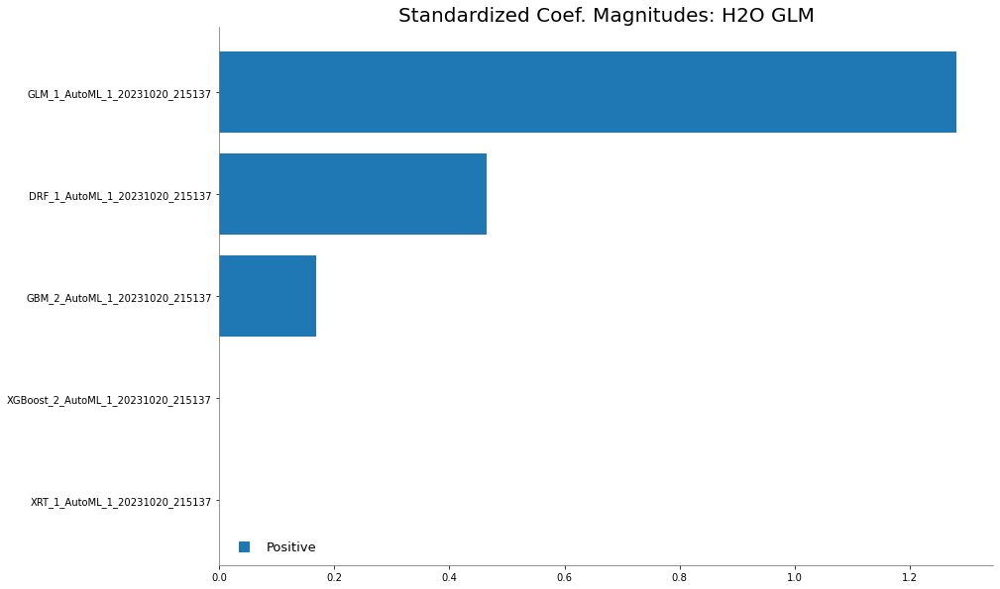

In [146]:
metalearner.std_coef_plot()


In [147]:
aml.leader

key,value
Stacking strategy,cross_validation
Number of base models (used / total),3/5
# GBM base models (used / total),1/1
# XGBoost base models (used / total),0/1
# GLM base models (used / total),1/1
# DRF base models (used / total),1/2
Metalearner algorithm,GLM
Metalearner fold assignment scheme,Random
Metalearner nfolds,20
Metalearner fold_column,None


model_id,auc,logloss,aucpr,mean_per_class_error,rmse,mse,training_time_ms,predict_time_per_row_ms,algo
XGBoost_3_AutoML_1_20231020_215137,0.773852,0.570682,0.69976,0.287251,0.441186,0.194645,177,0.023262,XGBoost
XGBoost_2_AutoML_1_20231020_215137,0.77205,0.587188,0.670151,0.27217,0.448285,0.200959,117,0.023403,XGBoost
XRT_1_AutoML_1_20231020_215137,0.738164,0.629447,0.610727,0.306417,0.47078,0.221634,138,0.028266,DRF


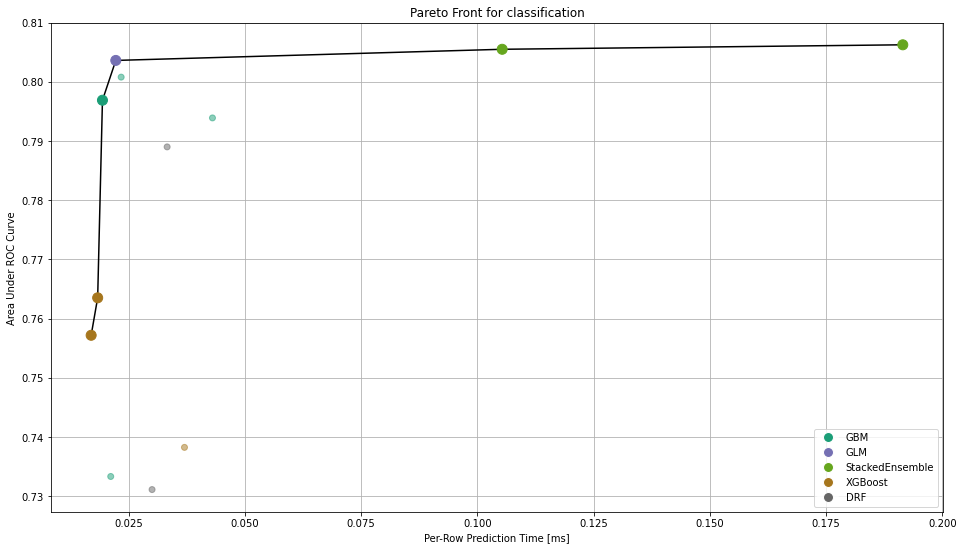

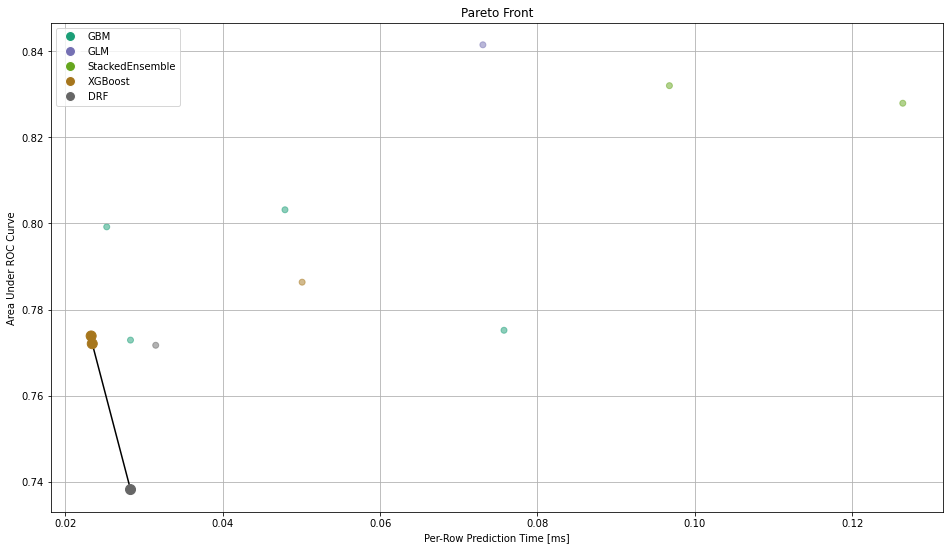

In [148]:
#show paretto front plot for automl aml
pf = aml.pareto_front()
pf.figure() # get the Pareto front plot
pf # H2OFrame containing the Pareto front subset of the leaderboard

combined_leaderboard = h2o.make_leaderboard([aml], test, extra_columns="ALL")
pf = h2o.explanation.pareto_front(combined_leaderboard, x_metric="predict_time_per_row_ms", y_metric="auc", optimum="bottom left")
pf.figure() # get the Pareto front plot
pf # H2OFrame containing the Pareto front subset of the leaderboard

In [149]:
# save best model
import os
save_dir = os.getcwd()
model_path = h2o.save_model(model=aml.leader, path=save_dir, force=True)

In [150]:
#load model
model = h2o.load_model('/Users/stephaniegessler/Documents/GitHub/recipe_site_traffic/StackedEnsemble_BestOfFamily_1_AutoML_1_20231020_215137')

#show model performance
model.model_performance()
 
    
#show model performance on training data
model.model_performance(train=True)
 
 
#show model performance on test data
model.model_performance(valid=True)
 
 
#show model performance on cross validation data
model.model_performance(xval=True)

ModelMetricsBinomialGLM: stackedensemble
** Reported on cross-validation data. **

MSE: 0.1696884677677599
RMSE: 0.4119326010013773
LogLoss: 0.5011856595007786
AUC: 0.8062436375975569
AUCPR: 0.7330924262767585
Gini: 0.6124872751951138
Null degrees of freedom: 707
Residual degrees of freedom: 704
Null deviance: 957.3741728369644
Residual deviance: 709.6788938531026
AIC: 717.6788938531026

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.43469517562333215
       0    1    Error    Rate
-----  ---  ---  -------  -------------
0      333  88   0.209    (88.0/421.0)
1      87   200  0.3031   (87.0/287.0)
Total  420  288  0.2472   (175.0/708.0)

Maximum Metrics: Maximum metrics at their respective thresholds
metric                       threshold    value     idx
---------------------------  -----------  --------  -----
max f1                       0.434695     0.695652  177
max f2                       0.202443     0.827854  304
max f0point5                 0.441187     0.695318  175
max accuracy                 0.441187     0.752825  175
max precision                0.728362     0.959459  35
max recall                   0.0481795    1         379
max specificity              0.970128     0.997625  0
max absolute_mcc             0.434695     0.48757   177
max min_per_class_accuracy   0.38869      0.731707  200
max mean_per_class_accuracy  0.434695     0.743919  177
max tns                      0.970128     420       0
max fns                      0.970128     287       0
max fps                      0.00222613   421       399
max tps                      0.0481795    287       379
max tnr                      0.970128     0.997625  0
max fnr                      0.970128     1         0
max fpr                      0.00222613   1         399
max tpr                      0.0481795    1         379

Gains/Lift Table: Avg response rate: 40.54 %, avg score: 40.57 %
group    cumulative_data_fraction    lower_threshold    lift       cumulative_lift    response_rate    score      cumulative_response_rate    cumulative_score    capture_rate    cumulative_capture_rate    gain      cumulative_gain    kolmogorov_smirnov
-------  --------------------------  -----------------  ---------  -----------------  ---------------  ---------  --------------------------  ------------------  --------------  -------------------------  --------  -----------------  --------------------
1        0.0112994                   0.948661           2.15854    2.15854            0.875            0.954725   0.875                       0.954725            0.0243902       0.0243902                  115.854   115.854            0.0220149
2        0.0211864                   0.942515           1.76207    1.97352            0.714286         0.945157   0.8                         0.95026             0.0174216       0.0418118                  76.2071   97.3519            0.034686
3        0.0310734                   0.940926           2.4669     2.1305             1                0.941438   0.863636                    0.947453            0.0243902       0.0662021                  146.69    113.05             0.0590762
4        0.0409605                   0.937455           2.4669     2.2117             1                0.939813   0.896552                    0.945609            0.0243902       0.0905923                  146.69    121.17             0.0834664
5        0.0508475                   0.931242           2.4669     2.26132            1                0.933813   0.916667                    0.943315            0.0243902       0.114983                   146.69    126.132            0.107857
6        0.100282                    0.903602           2.4669     2.36266            1                0.919657   0.957746                    0.931653            0.121951        0.236934                   146.69    136.266            0.229808
7        0.15113                     0.667857           1.30197    2.0058             0.527778         0.703301   0.813084              

In [151]:
aml.leader.model_performance(test_data=test)

ModelMetricsBinomialGLM: stackedensemble
** Reported on test data. **

MSE: 0.16152739939477279
RMSE: 0.40190471432265235
LogLoss: 0.5014183657853831
AUC: 0.8320115356885365
AUCPR: 0.7232409956255781
Gini: 0.664023071377073
Null degrees of freedom: 186
Residual degrees of freedom: 183
Null deviance: 250.34940146096366
Residual deviance: 187.53046880373327
AIC: 195.53046880373327

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3984429374207448
       0    1    Error    Rate
-----  ---  ---  -------  ------------
0      89   25   0.2193   (25.0/114.0)
1      14   59   0.1918   (14.0/73.0)
Total  103  84   0.2086   (39.0/187.0)

Maximum Metrics: Maximum metrics at their respective thresholds
metric                       threshold    value     idx
---------------------------  -----------  --------  -----
max f1                       0.398443     0.751592  83
max f2                       0.28466      0.825359  125
max f0point5                 0.439644     0.727273  77
max accuracy                 0.439644     0.791444  77
max precision                0.708486     0.904762  20
max recall                   0.00534716   1         174
max specificity              0.949397     0.991228  0
max absolute_mcc             0.398443     0.577581  83
max min_per_class_accuracy   0.423941     0.780822  79
max mean_per_class_accuracy  0.398443     0.79446   83
max tns                      0.949397     113       0
max fns                      0.949397     73        0
max fps                      0.00455463   114       186
max tps                      0.00534716   73        174
max tnr                      0.949397     0.991228  0
max fnr                      0.949397     1         0
max fpr                      0.00455463   1         186
max tpr                      0.00534716   1         174

Gains/Lift Table: Avg response rate: 39.04 %, avg score: 39.69 %
group    cumulative_data_fraction    lower_threshold    lift      cumulative_lift    response_rate    score       cumulative_response_rate    cumulative_score    capture_rate    cumulative_capture_rate    gain      cumulative_gain    kolmogorov_smirnov
-------  --------------------------  -----------------  --------  -----------------  ---------------  ----------  --------------------------  ------------------  --------------  -------------------------  --------  -----------------  --------------------
1        0.0106952                   0.947928           1.28082   1.28082            0.5              0.948754    0.5                         0.948754            0.0136986       0.0136986                  28.0822   28.0822            0.0049267
2        0.0213904                   0.947246           2.56164   1.92123            1                0.947832    0.75                        0.948293            0.0273973       0.0410959                  156.164   92.1233            0.032324
3        0.0320856                   0.944752           2.56164   2.1347             1                0.946591    0.833333                    0.947726            0.0273973       0.0684932                  156.164   113.47             0.0597212
4        0.0427807                   0.942696           1.28082   1.92123            0.5              0.943439    0.75                        0.946654            0.0136986       0.0821918                  28.0822   92.1233            0.0646479
5        0.0534759                   0.932183           2.56164   2.04932            1                0.93841     0.8                         0.945005            0.0273973       0.109589                   156.164   104.932            0.0920452
6        0.101604                    0.795538           2.56164   2.292              1                0.917129    0.894737                    0.931801            0.123288        0.232877                   156.164   129.2              0.215333
7        0.149733                    0.640502           2.27702   2.28718            0.888889         0.676726    0.892857                    0.849813   

In [153]:
# Get model ids for all models in the AutoML Leaderboard
model_ids = list(aml.leaderboard['model_id'].as_data_frame().iloc[:, 0])

# Loop through each model in the leaderboard and display feature importance (if available)
for model_id in model_ids:
    model = h2o.get_model(model_id)
    
    # Check if the model has feature importance (e.g., GBM or DRF)
    if hasattr(model, 'varimp'):
        print(f"Feature Importance for Model: {model_id}")
        print(model.varimp())


Feature Importance for Model: StackedEnsemble_BestOfFamily_1_AutoML_1_20231020_215137
None
Feature Importance for Model: StackedEnsemble_AllModels_1_AutoML_1_20231020_215137
None
Feature Importance for Model: GLM_1_AutoML_1_20231020_215137
[('category_Beverages', 1.1110520362854004, 1.0, 0.24981153663400435), ('category_Vegetable', 1.07387113571167, 0.9665354102603169, 0.24145169604830755), ('category_Potato', 0.5915740132331848, 0.5324449205916624, 0.1330108837859736), ('category_Breakfast', 0.43964841961860657, 0.3957046162198584, 0.09885157823105178), ('category_Pork', 0.401650071144104, 0.36150428425202086, 0.09030794074877323), ('category_Chicken', 0.3183004856109619, 0.28648566873171977, 0.07156742512949124), ('category_One Dish Meal', 0.10421231389045715, 0.0937960693892178, 0.023431340224350197), ('pt_protein', 0.08077629655599594, 0.07270253230087831, 0.018161931311265745), ('difficulty', 0.07512502372264862, 0.0676161163196419, 0.01689128591903332), ('category_Meat', 0.074921

By looking at the results, we can see that in fifteen minutes, and with less data, AutoML obtained scores somewhat close to what we obtained in the first tutorial. The AUC that we obtained was 0.828. Although this is a good AUC, because we have a very imbalanced dataset, we must also look at the misclassification errors for both classes. As you can see, our model is having a hard time classifying bad loans; this is mainly due because only about 3.6% of loans are labeled as bad loans. However, the model is doing very well when classifying good loans; although it is still far from being the best model, this gives us a solid starting point. Even though we set balance _lasses=True, we just tried a quick under-over sampling ratio. If we were to find the right value and gave AutoML more time, we could potentially improve the misclassification error for the bad_loan or predicted TRUE class

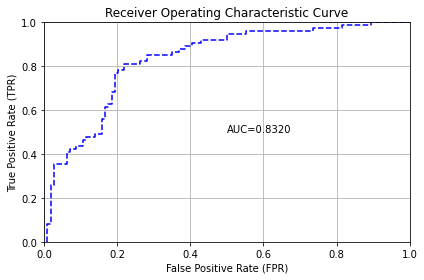

([0.008771929824561403,
  0.008771929824561403,
  0.008771929824561403,
  0.008771929824561403,
  0.008771929824561403,
  0.008771929824561403,
  0.008771929824561403,
  0.017543859649122806,
  0.017543859649122806,
  0.017543859649122806,
  0.017543859649122806,
  0.017543859649122806,
  0.017543859649122806,
  0.017543859649122806,
  0.017543859649122806,
  0.017543859649122806,
  0.017543859649122806,
  0.017543859649122806,
  0.017543859649122806,
  0.017543859649122806,
  0.017543859649122806,
  0.02631578947368421,
  0.02631578947368421,
  0.02631578947368421,
  0.02631578947368421,
  0.02631578947368421,
  0.02631578947368421,
  0.02631578947368421,
  0.02631578947368421,
  0.03508771929824561,
  0.043859649122807015,
  0.05263157894736842,
  0.06140350877192982,
  0.06140350877192982,
  0.06140350877192982,
  0.06140350877192982,
  0.06140350877192982,
  0.07017543859649122,
  0.07017543859649122,
  0.07894736842105263,
  0.08771929824561403,
  0.08771929824561403,
  0.09649122

In [154]:
%matplotlib inline
aml.leader.model_performance(test_data=test).plot()

In [155]:
#use model to predict on test data
pred = model.predict(test)

#show predictions
pred

#show predictions as pandas dataframe
pred_df = pred.as_data_frame()
pred_df

drf prediction progress: |███████████████████████████████████████████████████████| (done) 100%


,predict,p0,p1
0,1,0.486255,0.513745
1,1,0.554071,0.445929
2,1,0.626637,0.373363
3,0,0.849148,0.150852
4,1,0.704152,0.295848
...,...,...,...
182,1,0.762021,0.237979
183,1,0.677753,0.322247
184,1,0.678243,0.321757
185,0,0.767415,0.232585


In [156]:
#show predictions as pandas dataframe with actual values
pred_df = pred.as_data_frame()
pred_df['actual'] = test['high_traffic'].as_data_frame()
pred_df

,predict,p0,p1,actual
0,1,0.486255,0.513745,0
1,1,0.554071,0.445929,1
2,1,0.626637,0.373363,1
3,0,0.849148,0.150852,0
4,1,0.704152,0.295848,1
...,...,...,...,...
182,1,0.762021,0.237979,1
183,1,0.677753,0.322247,0
184,1,0.678243,0.321757,0
185,0,0.767415,0.232585,0


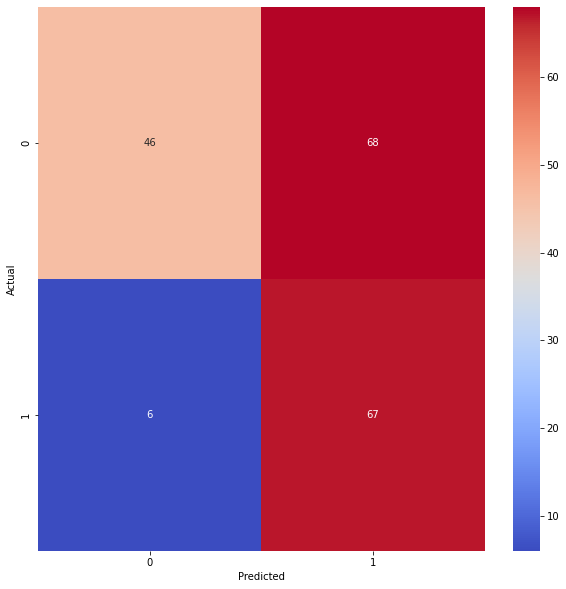

In [157]:
#plot confusion matrix
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(pred_df['actual'], pred_df['predict'])
plt.figure(figsize=(10,10))
sns.heatmap(cm, annot=True, cmap='coolwarm')
plt.xlabel('Predicted')
plt.ylabel('Actual')    
plt.show()

In [158]:
#show classification report
from sklearn.metrics import classification_report
print(classification_report(pred_df['actual'], pred_df['predict']))

              precision    recall  f1-score   support

           0       0.88      0.40      0.55       114
           1       0.50      0.92      0.64        73

    accuracy                           0.60       187
   macro avg       0.69      0.66      0.60       187
weighted avg       0.73      0.60      0.59       187



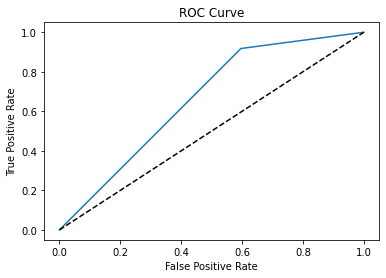

In [159]:
#show roc curve
from sklearn.metrics import roc_curve
fpr, tpr, thresholds = roc_curve(pred_df['actual'], pred_df['predict'])
plt.plot(fpr, tpr)
plt.plot([0,1], [0,1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.show()

In [160]:
#show auc score
from sklearn.metrics import roc_auc_score
roc_auc_score(pred_df['actual'], pred_df['predict'])

0.6606584955539534

In [161]:
#show accuracy score
from sklearn.metrics import accuracy_score
accuracy_score(pred_df['actual'], pred_df['predict'])

0.6042780748663101

In [162]:

#show precision score
from sklearn.metrics import precision_score
precision_score(pred_df['actual'], pred_df['predict'])

0.4962962962962963

In [163]:
#show recall score
from sklearn.metrics import recall_score
recall_score(pred_df['actual'], pred_df['predict'])

0.9178082191780822

In [164]:
#show f1 score
from sklearn.metrics import f1_score    
f1_score(pred_df['actual'], pred_df['predict'])

0.6442307692307692

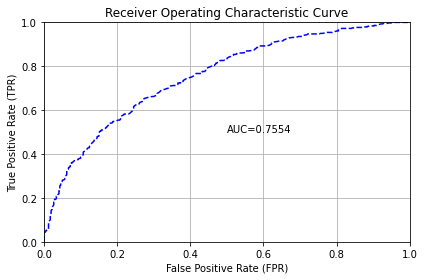

In [165]:
# Assuming you've already defined your model
perf = model.model_performance()

# Plot the AUC curve
perf.plot()

# Display the plot
import matplotlib.pyplot as plt
plt.show()


In [166]:
h2o.shutdown()

H2O session _sid_b972 closed.


/var/folders/ks/5bc1x9p158vgc4774v7r2tq40000gn/T/ipykernel_84114/2900054706.py:1: H2ODeprecationWarning: Deprecated, use ``h2o.cluster().shutdown()``.
  h2o.shutdown()


In [167]:
pip install auto-sklearn


Note: you may need to restart the kernel to use updated packages.


In [168]:
import autosklearn.classification


In [169]:
from sklearn.model_selection import train_test_split

# Assuming df is your DataFrame containing the data
X = df.drop('high_traffic', axis=1)
y = df['high_traffic']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)


In [170]:
automl = autosklearn.classification.AutoSklearnClassifier(
    time_left_for_this_task=600,
    per_run_time_limit=150,
    ensemble_size=1,
    memory_limit=None,  # Disabling memory limit
    metric=autosklearn.metrics.f1
)

automl.fit(X_train, y_train)

/var/folders/ks/5bc1x9p158vgc4774v7r2tq40000gn/T/ipykernel_84114/2387204897.py:1: DeprecationWarning: `ensemble_size` has been deprecated, please use `ensemble_kwargs = {'ensemble_size': 1}`. Inserting `ensemble_size` into `ensemble_kwargs` for now. `ensemble_size` will be removed in auto-sklearn 0.16.
  automl = autosklearn.classification.AutoSklearnClassifier(


In [ ]:
print(automl.show_models())


{73: {'model_id': 73, 'rank': 1, 'cost': 0.30097087378640774, 'ensemble_weight': 1.0, 'data_preprocessor': <autosklearn.pipeline.components.data_preprocessing.DataPreprocessorChoice object at 0x7f804a44fc40>, 'balancing': Balancing(random_state=1, strategy='weighting'), 'feature_preprocessor': <autosklearn.pipeline.components.feature_preprocessing.FeaturePreprocessorChoice object at 0x7f80696626a0>, 'classifier': <autosklearn.pipeline.components.classification.ClassifierChoice object at 0x7f8029b5c100>, 'sklearn_classifier': RandomForestClassifier(bootstrap=False, max_features=5, min_samples_leaf=16,
                       min_samples_split=17, n_estimators=512, n_jobs=1,
                       random_state=1, warm_start=True)}}


In [ ]:
# Extract the results into a DataFrame
import pandas as pd
results_df = pd.DataFrame(automl.cv_results_)

# Display models and their F1 scores
for index, row in results_df.iterrows():
    model_name = row['params']['classifier:__choice__']
    f1_score = row['mean_test_score']
    print(f"Model: {model_name}, F1 Score: {f1_score:.4f}")


Model: random_forest, F1 Score: 0.5967
Model: mlp, F1 Score: 0.5634
Model: extra_trees, F1 Score: 0.6699
Model: extra_trees, F1 Score: 0.6771
Model: mlp, F1 Score: 0.6304
Model: gradient_boosting, F1 Score: 0.6771
Model: gradient_boosting, F1 Score: 0.5859
Model: sgd, F1 Score: 0.6852
Model: random_forest, F1 Score: 0.6771
Model: gradient_boosting, F1 Score: 0.5659
Model: adaboost, F1 Score: 0.5103
Model: lda, F1 Score: 0.5761
Model: random_forest, F1 Score: 0.4973
Model: random_forest, F1 Score: 0.6771
Model: mlp, F1 Score: 0.5538
Model: adaboost, F1 Score: 0.4550
Model: mlp, F1 Score: 0.5572
Model: mlp, F1 Score: 0.6771
Model: passive_aggressive, F1 Score: 0.6781
Model: mlp, F1 Score: 0.6146
Model: gradient_boosting, F1 Score: 0.0392
Model: extra_trees, F1 Score: 0.5158
Model: adaboost, F1 Score: 0.6691
Model: random_forest, F1 Score: 0.6061
Model: sgd, F1 Score: 0.6771
Model: passive_aggressive, F1 Score: 0.6058
Model: sgd, F1 Score: 0.6466
Model: sgd, F1 Score: 0.6771
Model: mlp, F

In [ ]:
unique_models = results_df['params'].apply(lambda x: x['classifier:__choice__']).unique()
print("Unique models evaluated:")
for model in unique_models:
    print(model)


Unique models evaluated:
random_forest
mlp
extra_trees
gradient_boosting
sgd
adaboost
lda
passive_aggressive
k_nearest_neighbors
libsvm_svc
decision_tree
bernoulli_nb
gaussian_nb
qda


In [ ]:
pip install pipelineprofiler

Note: you may need to restart the kernel to use updated packages.


In [ ]:
import PipelineProfiler
# automl is an object Which has already been created.
profiler_data= PipelineProfiler.import_autosklearn(automl)
PipelineProfiler.plot_pipeline_matrix(profiler_data)

In [ ]:
from sklearn.model_selection import GridSearchCV

# Define the hyperparameters and their possible values
param_grid = {
    'C': [0.001, 0.01, 0.1, 1, 10, 100],
    'penalty': ['l1', 'l2'],
    'solver': ['liblinear', 'saga'],
    "multi_class": ["auto", "ovr", "multinomial"]
}

# Initialize the Logistic Regression model
logreg = LogisticRegression(random_state=42, max_iter=5000)

# Set up the grid search
grid_search = GridSearchCV(logreg, param_grid, cv=10, scoring='f1')

# Fit the model using the grid search
grid_search.fit(X_train, y_train)

# Get the best parameters and the associated accuracy
best_params = grid_search.best_params_
best_score = grid_search.best_score_

best_params, best_score


/Users/stephaniegessler/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/stephaniegessler/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/stephaniegessler/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py", line 1350, in fit
    multi_class = _check_multi_class(self.multi_class, solver,
  File "/Users/stephaniegessler/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py", line 473, in _check_multi_class
    raise ValueError("Solver %s does not support "
ValueError: Solver liblinear does not support a multinomial backend.

  warnings.warn("Estimator fit failed. The score on this train-test"
/Users/st

({'C': 1, 'multi_class': 'auto', 'penalty': 'l1', 'solver': 'liblinear'},
 0.6902471036887651)